Test slab_model.py
==================

Jinbo Wang

Jinbo.Wang@jpl.nasa.gov

last update: 12/31/2021

copied from full_wacm-scenario.ipynb

# WaCM was generated from the original

Highpass filtering and detides will be performed on the simulated WaCM data.

In [1]:
%load_ext autoreload
%autoreload 2

In [37]:
import glob 
import os

import sys
sys.path.append('../src')
sys.path.append('../')

import slab_model
import pylab as plt
import numpy as np
import xarray as xr
from popy import utils,mysignal
from scipy.io import loadmat
import pandas as pd
import pickle

xrod=xr.open_dataset

class COAS:
    

    def __init__(self):
        # note this is only appropriate for the coupled model as written on JPL Bura server.
        u_folder = '/u/bura-m0/hectorg/COAS/llc2160/coarse/Coarse/U/'
        v_folder =     '/u/bura-m0/hectorg/COAS/llc2160/coarse/Coarse/V/'
        tau_y_folder = '/u/bura-m0/hectorg/COAS/llc2160/coarse/Coarse/oceTAUY/'
        tau_x_folder = '/u/bura-m0/hectorg/COAS/llc2160/coarse/Coarse/oceTAUX/'

        u_files = np.sort(glob.glob(u_folder + '/*.nc'))[1:4000]
        v_files = np.sort(glob.glob(v_folder + '/*.nc'))[1:4000]
        tau_x_files = np.sort(glob.glob(tau_x_folder + '/*.nc'))[1:4000]
        tau_y_files = np.sort(glob.glob(tau_y_folder + '/*.nc'))[1:4000]

        self.U = xr.open_mfdataset(u_files,parallel=True,preprocess=addTimeDimCoarse)
        self.V = xr.open_mfdataset(v_files,parallel=True,preprocess=addTimeDimCoarse)
        self.TX = xr.open_mfdataset(tau_x_files,parallel=True,preprocess=addTimeDimCoarse)
        self.TY = xr.open_mfdataset(tau_y_files,parallel=True,preprocess=addTimeDimCoarse)

        self.U = self.U.rename({'U':'U'})
        self.V = self.V.rename({'V':'V'})
        self.TX = self.TX.rename({'oceTAUX':'TX'})
        self.TY = self.TY.rename({'oceTAUY':'TY'})

            
    
    def colocateModelPoints(self,lats,lons,times):
        
        
        if len(times) == 0:
            return [],[]
            
        ds_u =  self.U.interp(time=xr.DataArray(times.flatten(), dims='z'),
                            lat=xr.DataArray(lats.flatten(), dims='z'),
                            lon=xr.DataArray(lons.flatten(), dims='z'),
                            method='linear')

        ds_v =  self.V.interp(time=xr.DataArray(times.flatten(), dims='z'),
                            lat=xr.DataArray(lats.flatten(), dims='z'),
                            lon=xr.DataArray(lons.flatten(), dims='z'),
                            method='linear')
        
        ds_tx =  self.TX.interp(time=xr.DataArray(times.flatten(), dims='z'),
                            lat=xr.DataArray(lats.flatten(), dims='z'),
                            lon=xr.DataArray(lons.flatten(), dims='z'),
                            method='linear')

        ds_ty =  self.TY.interp(time=xr.DataArray(times.flatten(), dims='z'),
                            lat=xr.DataArray(lats.flatten(), dims='z'),
                            lon=xr.DataArray(lons.flatten(), dims='z'),
                            method='linear')
        

        u=np.reshape(ds_u['U'].values,np.shape(lats))
        v=np.reshape(ds_v['V'].values,np.shape(lats))
        tx=np.reshape(ds_tx['oceTAUX'].values,np.shape(lats))
        ty=np.reshape(ds_ty['oceTAUY'].values,np.shape(lats))

        return u,v,tx,ty
    
    def getModelLatLon(self,lats,lons):
        
        rho_water=1027.5
        
        ds_u =  self.U.sel(lat=lats,method='nearest').sel(lon=lons,method='nearest').compute()

        ds_v =  self.V.sel(lat=lats,method='nearest').sel(lon=lons,method='nearest').compute()
        
        ds_tx =  self.TX.sel(lat=lats,method='nearest').sel(lon=lons,method='nearest').compute()
        
        ds_ty =  self.TY.sel(lat=lats,method='nearest').sel(lon=lons,method='nearest').compute()
        
        #
        #
        ##
        ##
        ###
        ###
        ####
        ######## LOOK OUT!!!!! dividing by rho_water; not sure why!! Jinbo's slab model appears to expect this!!!###########
        ####
        ###
        ###
        ##
        ##
        #
        #
        return ds_u.U,ds_v.V,ds_tx.TX/rho_water,ds_ty.TY/rho_water

def addTimeDim(ds):
    # helper for COAS model format with mfdataset
    ds = ds.isel(time=0)
    fn = os.path.basename(ds.encoding["source"])
    time_str = fn.split('_')[-1].split('.')[0]
    time = pd.to_datetime(time_str, format='%Y%m%d%H')
    ds = ds.expand_dims(time=[time])

    #display(ds)
    return ds


def addTimeDimCoarse(ds):
    # helper for COAS model format with mfdataset
    fn = os.path.basename(ds.encoding["source"])
    time_str = fn.split('.')[0].split('_')[-1]

    time = pd.to_datetime(time_str, format='%Y%m%d%H')
    ds = ds.expand_dims(time=[time])

    return ds

def normalizeTo180(angle):
    # note this strange logic was originally to use numba JIT
    for idx,ang in np.ndenumerate(angle):
    
        ang =  ang % 360
        ang = (ang + 360) % 360
        if ang > 180:
            ang -= 360
        angle[idx] = ang
        
    return angle
            
def fixLon(ds):

    ds['lon'].values = normalizeTo180(ds['lon'].values)

    return ds    

  



In [38]:
%%time
coas_model = COAS()

display(coas_model.U)
display(coas_model.TX)


<xarray.Dataset>
Dimensions:  (time: 3999, lat: 1126, lon: 2250)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-07-04T12:00:00
  * lat      (lat) float64 -89.94 -89.78 -89.62 -89.46 ... 89.58 89.74 89.9 90.0
  * lon      (lon) float64 -179.9 -179.8 -179.6 -179.5 ... 179.6 179.7 179.9
Data variables:
    U        (time, lat, lon) float64 dask.array<chunksize=(1, 1126, 2250), meta=np.ndarray>

<xarray.Dataset>
Dimensions:  (time: 3999, lat: 1126, lon: 2250)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-07-04T12:00:00
  * lat      (lat) float64 -89.94 -89.78 -89.62 -89.46 ... 89.58 89.74 89.9 90.0
  * lon      (lon) float64 -179.9 -179.8 -179.6 -179.5 ... 179.6 179.7 179.9
Data variables:
    TX       (time, lat, lon) float64 dask.array<chunksize=(1, 1126, 2250), meta=np.ndarray>

CPU times: user 4min 46s, sys: 47.7 s, total: 5min 33s
Wall time: 4min 38s


In [4]:

times=np.array(pd.date_range(coas_model.U.time.values[0],coas_model.U.time.values[-1],freq='1h'))


In [39]:
d700=slab_model.create_wacm_from_model(coas_model,1/4,1/4,'700_1800',lat_i=45,lon_i=-180,times=times)


/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/indexes.py:224: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/indexes.py:224: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/indexes.py:224: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  indexer = index.get_loc(
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/indexes.py:224: FutureWarning: Passing method to Float64Index.get_loc is depre

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.py:559: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.py:560: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.py:559: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.p

bandpass to get true NIO
generate synthetic wacm


/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.py:559: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.py:560: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.py:559: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
/mnt/bura-m0/wineteer/anaconda3/envs/wacm/lib/python3.9/site-packages/xarray/core/missing.p

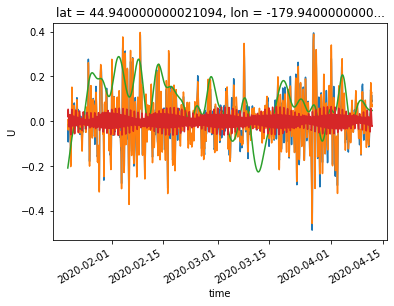

In [6]:
d700.u_truth_high_notide.plot()
d700.u_truth_high.plot()
d700.u_truth_low.plot()
d700.u_truth_high_tide.plot()


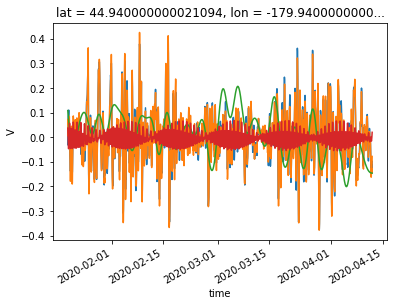

In [7]:
d700.v_truth_high_notide.plot()
d700.v_truth_high.plot()
d700.v_truth_low.plot()
d700.v_truth_high_tide.plot()

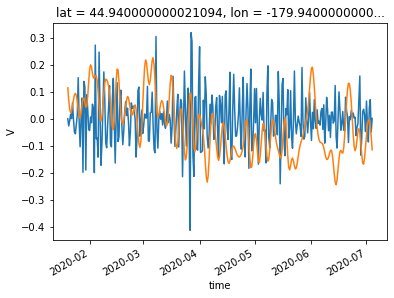

In [48]:
#d700.v_wacm_high_notide.plot()
d700.u_wacm_high.plot()
d700.v_wacm_low.plot()
#d700.v_wacm_high_tide.plot()

### Loop through the full year

In [46]:
# import slab_model
# import pylab as plt
# import numpy as np
# import xarray as xr
# from popy import utils
# from scipy.io import loadmat
# import pandas as pd

import warnings
warnings.filterwarnings('ignore')

from tqdm import tqdm

In [ ]:

m = slab_model.mld()


for fitting_method in ['Slab','Harmonics']:
    for use_hourly_wind in [False]:
        for orbit in ['700_1800','hourly']:
            for uv_noise in [0]:
                for lat_i in np.arange(45,70,10):
                    for lon_i in tqdm(np.arange(-180,180,10)):
                   # d700=slab_model.create_wacm_from_mooring(station,1/4,1/4,'700_1800')
                        
                        got_some = False

                        try:
                            d700=slab_model.create_wacm_from_model(coas_model,1/4,1/4,'700_1800',lat_i=lat_i,lon_i=lon_i,times=times)
                        except:
                            continue

                        time=d700.u_wacm_total.time.values

                        ndays=10 #days
                        nn=int((ndays*24)//d700.wacm_sampling_period)

                        tstart=np.datetime64(str(time[0])[:10])
                        tend=np.datetime64(str(time[-1])[:10])
                        #if 'Stratus' in station:
                        #    tend=np.datetime64('2008-02-29') #for stratus

                        #print('wacm data start and end dates are', tstart,tend)

                        total_hours=(tend-tstart)/np.timedelta64(1,'h')

                        newtime=pd.date_range(tstart, periods=total_hours, freq='1h')

                        incre_days=10
                        n0=ndays*24//2
                        
                        
                        for j in np.arange(n0,newtime.size-n0,incre_days*24): 

                            t_out=newtime[j-n0:j+n0]
                            
                            t0=t_out.min()-np.timedelta64(int(np.ceil(d700.wacm_sampling_period) ),'h')
                            t1=t_out.max()+np.timedelta64(int(np.ceil(d700.wacm_sampling_period) ),'h')

                            #print(t_out.min(),t_out.max())
                                   
                            u=d700.u_wacm_high_notide.sel(time=slice(t0,t1))
                            
                            display(u)
                            
                            month = t_out.mean().month

                            c_clim,c_clim_std = m.getmld(lat_i,lon_i,month)
                            
                            if np.isnan(c_clim):
                                continue
                            
                            c_min = np.nanmax([0,c_clim-5*c_clim_std])
                            c_max = np.nanmin([2000,c_clim+5*c_clim_std])

                            #try:
                            up,vp,utid,vtid,param=d700.get_wacm_nio(t_out,fitting_method=fitting_method,
                                                                    has_tides=False,uv_noise=uv_noise,
                                                                    wind_noise=0,use_hourly_wind=use_hourly_wind,
                                                                    is_windstress=True,c_clim=c_clim,c_max=c_max,c_min=c_min)
#                             except:
#                                 print('Failed')
#                                 continue
                                
                            if j==n0:
                                upp=up*1;vpp=vp*1
                                utidd=utid*1;vtidd=vtid*1
                            else:
                                upp=xr.concat([upp,up*1],dim='time')
                                vpp=xr.concat([vpp,vp*1],dim='time')
                                utidd=xr.concat([vtidd,vtid*1],dim='time')
                                vtidd=xr.concat([vtidd,vtid*1],dim='time')
                            
                            got_some = True
                            
                            del up,vp,utid,vtid

                        if got_some == False:
                            continue
                            
                        d700.nio_reconstruction_u=upp
                        d700.nio_reconstruction_v=vpp
                        d700.reconstruction_tides_u=utidd
                        d700.reconstruction_tides_v=vtidd

                        if use_hourly_wind:
                            fnout='/u/bura-m0/wineteer/wacm/nio/reconstruction_hourly_windv2/reconstruction_lat_%s_lon_%s_uvnoise_%4.2f_%s_%s.pkl'%(str(lat_i),str(lon_i),uv_noise,fitting_method,orbit)
                        else:
                            fnout='/u/bura-m0/wineteer/wacm/nio/reconstruction_wacm_windv2/reconstruction_lat_%s_lon_%s_uvnoise_%4.2f_%s_%s.pkl'%(str(lat_i),str(lon_i),uv_noise,fitting_method,orbit)

                        with open(fnout, 'wb') as ff:
                            pickle.dump(d700,ff,pickle.HIGHEST_PROTOCOL)
                        del d700

  0%|                                                                                                               | 0/36 [00:00<?, ?it/s]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([5.85962456, 5.78935684, 5.78168419, 5.76345251, 5.7182158 ,
       5.73692402, 5.64410389, 5.55908534, 5.51919052, 5.51709282,
       5.51750373, 5.62285562, 5.4197751 , 5.29721145, 5.3630342 ,
       5.40905393, 5.09072204, 5.40099876, 5.33763305])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[-2.9531632714269174e-05, -0.0003067343590452132, 97.25924665937931, 2e-06, 0, 0]
[[-3, -3, 44.689994263685044, 2e-07, -3, -3], [3, 3, 149.8284990550736, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-2.9531632714269174e-05
-0.0003067343590452132
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
97.25924665937931
2e-06
14993.916666666666
15003.240416666667
-2.954653387546302e-05
-0.0003067343590452132
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
97.259246659379

<xarray.DataArray 'U' (time: 21)>
array([5.40099876, 5.33763305, 5.00227835, 5.2370042 , 5.16096618,
       5.03791443, 5.00884608, 5.01408168, 4.96694925, 4.99186506,
       4.95024335, 4.66807888, 5.1135809 , 4.72457869, 4.69755374,
       4.58724868, 4.94498316, 4.70022111, 4.45296047, 4.50021693,
       4.58613435])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[0.13872437587632971, 0.1664425182676177, 109.31286887035259, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 246.805249529406, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
0.13872437587632971
0.1664425182676177
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
109.31286887035259
2e-06
15002.722430555556
15013.082152777777
0.1387243907774909
0.1664425182676177
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309

<xarray.DataArray 'U' (time: 22)>
array([4.50021693, 4.58613435, 4.69665559, 4.55667745, 4.36395742,
       4.30396715, 4.36043727, 4.38088322, 4.43705078, 4.17833539,
       4.14045553, 4.26857609, 4.3247888 , 4.11633426, 3.93965729,
       4.05680596, 4.16709929, 3.9052076 , 3.89583125, 3.99144055,
       3.99712026, 3.8263389 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.09130430713737725, -0.1946758916567849, 109.31286887035259, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 246.805249529406, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.09130430713737725
-0.1946758916567849
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
109.31286887035259
2e-06
15012.564166666667
15023.441875
-0.09130432203853844
-0.1946758916567849
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023

<xarray.DataArray 'U' (time: 21)>
array([3.99712026, 3.8263389 , 3.72344223, 3.7357735 , 3.77254665,
       3.77701569, 3.68861638, 3.68333607, 3.59368385, 3.47485518,
       3.48456624, 3.56463971, 3.50156088, 3.48329172, 3.41705545,
       3.36826506, 3.1790982 , 3.22277867, 3.35665861, 3.3439516 ,
       3.11654236])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[0.10621611976323936, 0.011373146104487343, 109.31286887035259, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 246.805249529406, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
0.10621611976323936
0.011373146104487343
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
109.31286887035259
2e-06
15022.923888888889
15033.283611111112
0.10621613466440055
0.011373146104487343
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010

<xarray.DataArray 'U' (time: 21)>
array([3.3439516 , 3.11654236, 3.14316028, 3.14321333, 3.0295929 ,
       3.01427291, 3.03103606, 2.97633439, 2.94455357, 3.02375618,
       2.78857325, 2.75102689, 2.82153814, 2.78916775, 2.82653412,
       2.6694371 , 2.54241649, 2.50121328, 2.8907212 , 2.51733707,
       2.4049244 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[0.11806150467733145, 0.09516855734406258, 97.8925551606618, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 270.3192479265151, 2e-05, 3, 3]]
15032.765625
15043.125347222222
0.11806150467733145
0.09516855734406258
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
97.8925551606618
2e-06
15032.765625
15043.125347222222
0.11806151957849265
0.09516855734406258
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.0001030961686969986

<xarray.DataArray 'U' (time: 22)>
array([2.51733707, 2.4049244 , 2.48470597, 2.47102244, 2.41639261,
       2.39211458, 2.32473925, 2.32915443, 2.26040638, 2.19797071,
       2.20613522, 2.22912993, 2.12140796, 2.11034222, 2.05919133,
       1.93452976, 1.96177656, 2.11403528, 1.93537569, 1.78417775,
       1.81733573, 1.85165772])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[-0.04035025578848961, 0.04378734048325728, 97.8925551606618, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 270.3192479265151, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
-0.04035025578848961
0.04378734048325728
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
97.8925551606618
2e-06
15042.607361111111
15053.485069444445
-0.0403502706896508
0.04378734048325728
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96

<xarray.DataArray 'U' (time: 21)>
array([1.81733573, 1.85165772, 1.86965228, 1.644073  , 1.71950553,
       1.75122817, 1.6935691 , 1.39483995, 1.54572555, 1.71732384,
       1.52750129, 1.36865584, 1.44628418, 1.51364615, 1.29380001,
       0.91455929, 1.60505561, 1.54510641, 1.07836378, 0.9724829 ,
       1.2258101 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[-0.03257031403262692, -0.010187174997784681, 97.8925551606618, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 270.3192479265151, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
-0.03257031403262692
-0.010187174997784681
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
97.8925551606618
2e-06
15052.967083333333
15063.326805555556
-0.03257032893378811
-0.010187174997784681
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00

<xarray.DataArray 'U' (time: 21)>
array([0.9724829 , 1.2258101 , 1.19828032, 0.96482707, 0.92749775,
       1.14185593, 1.2397351 , 0.81429745, 0.77829678, 0.75135093,
       0.8990812 , 0.76376847, 0.91423935, 0.82209855, 0.62202359,
       0.5531556 , 0.55778196, 0.64607118, 0.52749887, 0.60983605,
       0.52075277])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[-0.21408943016129986, -0.2637802410365374, 128.3863009838542, 2e-06, 0, 0]
[[-3, -3, 109.6804513872476, 2e-07, -3, -3], [3, 3, 147.09215058046078, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
-0.21408943016129986
-0.2637802410365374
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
128.3863009838542
2e-06
15062.808819444444
15073.168541666666
-0.21408944506246105
-0.2637802410365374
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073

<xarray.DataArray 'U' (time: 21)>
array([ 0.60983605,  0.52075277,  0.3744867 ,  0.35005255,  0.42434406,
        0.41564389,  0.26648169,  0.12672041,  0.32429492,  0.25383078,
        0.15150901,  0.21273832,  0.03272092, -0.10659226,  0.1119756 ,
        0.09553484, -0.08234453, -0.15442531, -0.08637856,  0.02601785,
       -0.33393394])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[0.0883908574977246, 0.044654634053608575, 128.3863009838542, 2e-06, 0, 0]
[[-3, -3, 109.6804513872476, 2e-07, -3, -3], [3, 3, 147.09215058046078, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
0.0883908574977246
0.044654634053608575
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
128.3863009838542
2e-06
15072.650555555556
15083.010277777777
0.0883908723988858
0.044654634053608575
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01

<xarray.DataArray 'U' (time: 22)>
array([ 0.02601785, -0.33393394, -0.36757037, -0.22077531, -0.12121206,
       -0.2978547 , -0.42137436, -0.46554486, -0.45825234, -0.45635238,
       -0.3828829 , -0.57387756, -0.68171696, -0.57616828, -0.48584262,
       -0.74759086, -0.85322838, -0.72581928, -0.65182566, -0.78114112,
       -1.03837206, -0.84545629])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[0.17292353112605052, 0.02069393483711604, 128.3863009838542, 2e-06, 0, 0]
[[-3, -3, 109.6804513872476, 2e-07, -3, -3], [3, 3, 147.09215058046078, 2e-05, 3, 3]]
15082.492291666667
15093.37
0.17292353112605052
0.02069393483711604
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
128.3863009838542
2e-06
15082.492291666667
15093.37
0.17292354602721172
0.02069393483711604
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 1509

<xarray.DataArray 'U' (time: 21)>
array([-1.03837206, -0.84545629, -0.74107883, -1.07488506, -1.09726737,
       -1.03578553, -0.95562949, -1.10975184, -1.0266024 , -1.20043541,
       -1.37833852, -1.23670479, -1.20420793, -1.28995439, -1.35464628,
       -1.27759585, -1.46499717, -1.48839168, -1.65280763, -1.42652355,
       -1.36158003])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[-0.18395384653919006, -0.1656261112464565, 37.91942682092542, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 205.31456382294468, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
-0.18395384653919006
-0.1656261112464565
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
37.91942682092542
2e-06
15092.852013888889
15103.21173611111
-0.18395386144035125
-0.1656261112464565
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.000103096

<xarray.DataArray 'U' (time: 21)>
array([-1.42652355, -1.36158003, -1.65895271, -1.73492056, -1.67667065,
       -1.62444946, -1.67124932, -1.82982547, -1.85042399, -1.82124094,
       -1.86279269, -1.96302212, -1.77036932, -1.91522381, -2.25821286,
       -2.10813532, -1.95987072, -1.96286664, -2.23433845, -2.320128  ,
       -2.18994585])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[0.09123922518299546, 0.02849201461684503, 37.91942682092542, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 205.31456382294468, 2e-05, 3, 3]]
15102.69375
15113.053472222222
0.09123922518299546
0.02849201461684503
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
37.91942682092542
2e-06
15102.69375
15113.053472222222
0.09123924008415665
0.02849201461684503
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.000103096168696998

<xarray.DataArray 'U' (time: 22)>
array([-2.320128  , -2.18994585, -2.23866027, -2.18976901, -2.39564084,
       -2.40102214, -2.29091173, -2.50246486, -2.57603168, -2.51106555,
       -2.36064869, -2.57892851, -2.66538555, -2.66860033, -2.67106369,
       -2.72452058, -2.77939413, -2.8474888 , -2.63334518, -2.85973305,
       -2.97038518, -2.9857114 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[-0.1371215676090361, -0.07798246232580222, 37.91942682092542, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 205.31456382294468, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
-0.1371215676090361
-0.07798246232580222
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
37.91942682092542
2e-06
15112.535486111112
15123.413194444445
-0.1371215825101973
-0.07798246232580222
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 1512

<xarray.DataArray 'U' (time: 21)>
array([-2.97038518, -2.9857114 , -2.8878065 , -2.99770185, -3.08860018,
       -3.05899329, -3.0078405 , -3.14118683, -3.25649875, -3.17800025,
       -3.2828533 , -3.20212457, -3.32148815, -3.3799498 , -3.35087003,
       -3.43298029, -3.46230417, -3.51065575, -3.49599125, -3.5199155 ,
       -3.63102807])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[-0.07556464461310176, -0.053889268706119646, 18.570286477477197, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 83.55291721461741, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
-0.07556464461310176
-0.053889268706119646
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
18.570286477477197
2e-06
15122.895208333333
15133.254930555555
-0.07556465951426296
-0.053889268706119646
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.0001

<xarray.DataArray 'U' (time: 21)>
array([-3.5199155 , -3.63102807, -3.57807928, -3.75110229, -3.71931247,
       -3.65037353, -3.73783389, -3.84372989, -3.8303399 , -3.93803778,
       -3.88968236, -3.9141847 , -4.00030699, -4.01641863, -3.93081655,
       -4.14665318, -4.23296433, -4.1607476 , -4.09372186, -4.18705292,
       -4.30527423])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.03882496863243283, 0.03706180150022817, 18.570286477477197, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 83.55291721461741, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.03882496863243283
0.03706180150022817
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
18.570286477477197
2e-06
15132.736944444445
15143.096666666666
0.038824983533594024
0.03706180150022817
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00

<xarray.DataArray 'U' (time: 22)>
array([-4.18705292, -4.30527423, -4.30977944, -4.3050777 , -4.40683213,
       -4.44595049, -4.35619881, -4.44020281, -4.50048313, -4.62729002,
       -4.57129332, -4.61163856, -4.61816629, -4.67166432, -4.69987199,
       -4.74459254, -4.78631287, -4.87989079, -4.89502373, -4.90486869,
       -4.86520798, -4.79887068])
Coordinates:
    lat      float64 44.94
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[0.0350484915684984, 0.09725772421210319, 18.570286477477197, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 83.55291721461741, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
0.0350484915684984
0.09725772421210319
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
18.570286477477197
2e-06
15142.578680555556
15153.45638888889
0.035048506469659596
0.09725772421210319
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.938

  3%|██▊                                                                                                 | 1/36 [11:01<6:25:45, 661.31s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([7.44098672, 7.37336476, 7.29957006, 7.24427643, 7.254698  ,
       7.31816439, 7.23703757, 7.13203408, 6.99226286, 7.05047482,
       6.93872438, 6.9310401 , 7.1440205 , 6.80999034, 6.84045639,
       6.89681597, 6.54233689, 6.51502479, 6.96938698])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

<xarray.DataArray 'U' (time: 21)>
array([6.51502479, 6.96938698, 6.76020455, 6.58448153, 6.17310164,
       6.66974267, 6.74459272, 6.07564412, 6.21278502, 6.64792055,
       6.5235301 , 5.94489904, 5.97875192, 6.43184464, 6.28695245,
       5.7952989 , 5.98849432, 6.2103157 , 6.04034455, 5.75442348,
       5.72902026])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

<xarray.DataArray 'U' (time: 22)>
array([5.75442348, 5.72902026, 5.87315653, 5.90330036, 5.79928322,
       5.67065848, 5.6350788 , 5.50497092, 5.59997672, 5.61609935,
       5.48866079, 5.35265093, 5.50462625, 5.38482368, 5.14323597,
       5.39584727, 5.44294158, 5.0615515 , 4.79069706, 5.30518131,
       5.40344843, 4.87948685])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

<xarray.DataArray 'U' (time: 21)>
array([5.40344843, 4.87948685, 4.75449006, 4.99376169, 5.10694742,
       4.81166403, 4.59494789, 4.88758916, 4.85974521, 4.68578836,
       4.45881779, 4.629245  , 4.60328129, 4.56459571, 4.57268059,
       4.42757736, 4.23236757, 4.22115618, 4.45661543, 4.45263057,
       4.13059391])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

<xarray.DataArray 'U' (time: 21)>
array([4.45263057, 4.13059391, 4.13313959, 4.13415975, 4.07782989,
       4.04507469, 4.08060824, 4.00031007, 3.85610851, 3.87576981,
       3.88549083, 3.83919021, 3.68837027, 3.72675138, 3.74906477,
       3.64478706, 3.52484803, 3.4754503 , 3.55955694, 3.55346211,
       3.43765515])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([3.55346211, 3.43765515, 3.34056503, 3.26830115, 3.35183558,
       3.24315058, 3.20193205, 3.19189075, 3.20058844, 3.03734735,
       2.96892945, 3.03211092, 3.00266697, 2.94529046, 2.82928578,
       2.82986881, 2.82179473, 2.72179724, 2.71783947, 2.66645712,
       2.64523501, 2.52276963])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([2.64523501, 2.52276963, 2.560249  , 2.56413594, 2.46095135,
       2.32389344, 2.34086127, 2.44007167, 2.23845726, 2.17720447,
       2.31246296, 2.223211  , 1.9269047 , 2.14078421, 2.15708078,
       1.8214475 , 1.99998612, 1.87030767, 1.93669352, 1.9105798 ,
       1.65238317])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([1.9105798 , 1.65238317, 1.78101127, 1.72012674, 1.53855041,
       1.57119697, 1.67512947, 1.69944501, 1.39002132, 1.36533166,
       1.35016823, 1.34546885, 1.35791261, 1.33642388, 1.33184638,
       1.13319491, 1.03605081, 1.09059261, 1.0957382 , 1.03931219,
       0.98561393])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([1.03931219, 0.98561393, 1.05464813, 0.83022379, 0.76692001,
       0.79392217, 0.83171948, 0.86523778, 0.45288165, 0.62444723,
       0.79436918, 0.59593739, 0.40040932, 0.34626776, 0.5897029 ,
       0.41170594, 0.31590227, 0.19087476, 0.34914313, 0.3001416 ,
       0.20565471])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([ 0.3001416 ,  0.20565471, -0.00779968,  0.04709206,  0.15225066,
        0.0714409 , -0.07737304, -0.10856147, -0.08897249, -0.15376663,
       -0.23671325, -0.20034705, -0.24791936, -0.45072269, -0.38118078,
       -0.25804869, -0.35696007, -0.70128585, -0.61317451, -0.49594688,
       -0.51774868, -0.71144068])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([-0.51774868, -0.71144068, -0.75072364, -0.69291442, -0.80658909,
       -0.80945984, -0.97619472, -0.89235352, -0.84390225, -1.15338305,
       -0.96577065, -0.96008136, -1.20023713, -1.28999965, -1.25758968,
       -1.12218618, -1.17548643, -1.46626569, -1.45916382, -1.35773632,
       -1.46467543])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([-1.35773632, -1.46467543, -1.48636725, -1.50893819, -1.5477229 ,
       -1.80269568, -1.72833783, -1.59625775, -1.58035233, -1.94655136,
       -1.97244531, -1.75518863, -1.905672  , -2.04740316, -2.13320988,
       -1.77265395, -2.19482034, -2.15962283, -2.18061215, -2.21520405,
       -2.36216116])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([-2.21520405, -2.36216116, -2.31056923, -2.26262323, -2.23498741,
       -2.62998771, -2.51453015, -2.34264132, -2.6153057 , -2.78859793,
       -2.62254058, -2.45856695, -2.71210783, -2.93038666, -2.82583211,
       -2.75907316, -2.98390535, -2.98507799, -2.90712151, -2.9228201 ,
       -3.08511485, -3.25323622])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([-3.08511485, -3.25323622, -3.11068141, -3.11645126, -3.27478782,
       -3.33243836, -3.2700785 , -3.29463824, -3.45780319, -3.47739254,
       -3.47205036, -3.5126214 , -3.55184998, -3.66284106, -3.65713212,
       -3.64647116, -3.70998162, -3.87482607, -3.83566676, -3.81889781,
       -3.9013935 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([-3.81889781, -3.9013935 , -3.91457118, -3.98795686, -4.09386513,
       -4.15401907, -4.12649545, -3.99239711, -4.12547079, -4.44217308,
       -4.3183886 , -4.2553817 , -4.34571058, -4.49422284, -4.42098137,
       -4.42469345, -4.56738712, -4.62825189, -4.59611713, -4.70642672,
       -4.74556419])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([-4.70642672, -4.74556419, -4.73004446, -4.65738888, -4.87466468,
       -4.958565  , -4.96117999, -4.93279727, -4.90803952, -5.12803193,
       -5.08214198, -5.10677866, -5.16785084, -5.2081409 , -5.30677815,
       -5.3158232 , -5.29703923, -5.37795569, -5.37841281, -5.55612264,
       -5.52672699, -5.47847593])
Coordinates:
    lat      float64 44.94
    lon      float64 -170.0
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

  6%|█████▌                                                                                              | 2/36 [23:42<6:48:05, 720.17s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([45.08357619, 44.58971157, 44.49475596, 44.40383679, 44.21073477,
       43.65262601, 43.56964098, 43.47114267, 43.02480538, 42.64967418,
       42.34728609, 42.49067881, 42.06586408, 41.72358284, 41.46873755,
       41.4503592 , 40.94130092, 40.46267444, 40.50121842])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[0.0006817287701938318, -7.970800217399487e-05, 92.52989528593858, 2e-06, 0, 0]
[[-3, -3, 3.382947786567101, 2e-07, -3, -3], [3, 3, 181.67684278531004, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
0.0006817287701938318
-7.970800217399487e-05
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
92.52989528593858
2e-06
14993.916666666666
15003.240416666667
0.0006817436713550257
-7.970800217399487e-05
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
92.52989528593858
2e

<xarray.DataArray 'U' (time: 21)>
array([40.46267444, 40.50121842, 40.54173966, 39.93216573, 39.57164082,
       39.5492305 , 39.34098765, 38.80359185, 38.55361545, 38.63658893,
       38.34466881, 37.74890394, 37.66692948, 37.45442203, 37.20448093,
       36.96138766, 36.58366745, 36.52117851, 36.08279728, 35.78284528,
       35.69007395])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[-0.27150814202344753, -0.07881234179149965, 85.36722849870606, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 239.1693144513815, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
-0.27150814202344753
-0.07881234179149965
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
85.36722849870606
2e-06
15002.722430555556
15013.082152777777
-0.2715081569246087
-0.07881234179149965
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.

<xarray.DataArray 'U' (time: 22)>
array([35.78284528, 35.69007395, 35.64520766, 34.94970761, 34.6997455 ,
       34.79649239, 34.53297049, 33.93643197, 33.73027387, 33.80875728,
       33.3528274 , 32.95255967, 32.81747886, 32.79885646, 32.20995044,
       31.96006616, 31.98385189, 31.65970465, 31.06865852, 30.87178183,
       31.18315383, 30.59032158])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.10751682568305448, -0.036301937353807046, 85.36722849870606, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 239.1693144513815, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.10751682568305448
-0.036301937353807046
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
85.36722849870606
2e-06
15012.564166666667
15023.441875
-0.10751684058421568
-0.036301937353807046
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 

<xarray.DataArray 'U' (time: 21)>
array([31.18315383, 30.59032158, 30.05606431, 29.92645671, 30.07659941,
       29.47995175, 29.00204717, 29.09564708, 28.99832695, 28.4542696 ,
       28.06743801, 27.90085111, 27.9920606 , 27.3679918 , 27.22765342,
       26.95548526, 26.93297011, 26.20293263, 26.15845115, 26.0371435 ,
       25.84018653])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[0.3846192568543112, -0.18855530246511593, 85.36722849870606, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 239.1693144513815, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
0.3846192568543112
-0.18855530246511593
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
85.36722849870606
2e-06
15022.923888888889
15033.283611111112
0.3846192717554724
-0.18855530246511593
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.000103096

<xarray.DataArray 'U' (time: 21)>
array([26.0371435 , 25.84018653, 25.34832528, 25.07963637, 25.03993344,
       24.71703595, 24.25207752, 24.21070093, 24.04192088, 23.62128172,
       23.28122472, 23.20706703, 22.95213321, 22.57896149, 22.3019053 ,
       22.19934495, 21.92351706, 21.55061011, 21.3372942 , 21.17120566,
       20.80317938])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[0.09021829351167368, -0.09515564787124936, 96.84656723727981, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 227.55116620851993, 2e-05, 3, 3]]
15032.765625
15043.125347222222
0.09021829351167368
-0.09515564787124936
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
96.84656723727981
2e-06
15032.765625
15043.125347222222
0.09021830841283487
-0.09515564787124936
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.0001030961686

<xarray.DataArray 'U' (time: 22)>
array([21.17120566, 20.80317938, 20.55702559, 20.35037307, 20.20146409,
       19.83565202, 19.30321902, 19.40154357, 19.28446692, 18.75680333,
       18.40627591, 18.32455393, 18.05032548, 17.85580173, 17.51134972,
       17.24657987, 17.04869657, 16.73947522, 16.47445689, 16.27070164,
       16.13892518, 15.66724679])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[0.06890642769729512, 0.06494592480105266, 96.84656723727981, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 227.55116620851993, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
0.06890642769729512
0.06494592480105266
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
96.84656723727981
2e-06
15042.607361111111
15053.485069444445
0.06890644259845631
0.06494592480105266
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.9

<xarray.DataArray 'U' (time: 21)>
array([16.13892518, 15.66724679, 15.38347096, 15.26137959, 15.11855807,
       14.68215428, 14.38018584, 14.28550134, 13.95714389, 13.72516609,
       13.30766564, 13.23911464, 13.14051746, 12.58668014, 12.33207795,
       12.29680627, 11.92146263, 11.47788203, 11.38044066, 11.41318233,
       10.8743298 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[0.14135764232858844, 0.07169017848267456, 96.84656723727981, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 227.55116620851993, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
0.14135764232858844
0.07169017848267456
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
96.84656723727981
2e-06
15052.967083333333
15063.326805555556
0.14135765722974963
0.07169017848267456
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309

<xarray.DataArray 'U' (time: 21)>
array([11.41318233, 10.8743298 , 10.55376166, 10.41999247, 10.20152435,
        9.74386126,  9.47033323,  9.5360216 ,  9.32070612,  8.74790375,
        8.48306286,  8.38416213,  8.15776247,  7.73231475,  7.53418956,
        7.56671111,  6.99299917,  6.73040017,  6.56864354,  6.40754441,
        5.93882698])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[0.2627504451341247, 0.009191239676647645, 62.68985244019466, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 200.32914761021763, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
0.2627504451341247
0.009191239676647645
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
62.68985244019466
2e-06
15062.808819444444
15073.168541666666
0.2627504600352859
0.009191239676647645
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.0001

<xarray.DataArray 'U' (time: 21)>
array([6.40754441, 5.93882698, 5.76823196, 5.62401518, 5.38340979,
       4.93152369, 4.79089181, 4.46373158, 4.26499202, 4.03812678,
       3.73635445, 3.55810114, 3.34768834, 2.93058009, 2.56426654,
       2.54600503, 2.28116667, 1.96319713, 1.69030568, 1.50988571,
       1.20692476])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[0.0966983234205017, 0.020435834449019877, 62.68985244019466, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 200.32914761021763, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
0.0966983234205017
0.020435834449019877
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
62.68985244019466
2e-06
15072.650555555556
15083.010277777777
0.0966983383216629
0.020435834449019877
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.0001

<xarray.DataArray 'U' (time: 22)>
array([ 1.50988571,  1.20692476,  0.94829699,  0.68326891,  0.44104882,
        0.06339302, -0.05452423, -0.12190943, -0.57828841, -0.973887  ,
       -1.16169054, -1.25355066, -1.52559497, -1.93568783, -2.20149679,
       -2.23642949, -2.56158309, -2.96043576, -3.19267315, -3.32654221,
       -3.64225028, -3.90204254])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[0.037063684670816055, 0.15412051759191792, 62.68985244019466, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 200.32914761021763, 2e-05, 3, 3]]
15082.492291666667
15093.37
0.037063684670816055
0.15412051759191792
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
62.68985244019466
2e-06
15082.492291666667
15093.37
0.03706369957197725
0.15412051759191792
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]


<xarray.DataArray 'U' (time: 21)>
array([-3.64225028, -3.90204254, -4.15792495, -4.39578957, -4.67019145,
       -4.89975195, -5.16380958, -5.39623883, -5.77211227, -5.93937486,
       -6.18813012, -6.41995804, -6.62597814, -6.9647949 , -7.27934729,
       -7.49612478, -7.74078866, -7.93305548, -8.16264169, -8.57729196,
       -8.75072994])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([ -8.57729196,  -8.75072994,  -8.91253206,  -9.31986371,
        -9.50417059,  -9.73721642, -10.0131212 , -10.3446434 ,
       -10.51597394, -10.70982896, -11.0910631 , -11.33629737,
       -11.36746603, -11.87072497, -12.26566   , -12.34957774,
       -12.26279263, -12.80503687, -13.26819039, -13.36015006,
       -13.46918436])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([-13.36015006, -13.46918436, -13.94545704, -14.20459373,
       -14.17228399, -14.46107834, -15.07124777, -15.21023409,
       -15.25081655, -15.60642535, -16.0354639 , -16.02249579,
       -16.31682007, -16.71511063, -17.01116133, -17.1308097 ,
       -17.32640426, -17.67947313, -17.99017352, -18.22504213,
       -18.37650013, -18.5814458 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([-18.37650013, -18.5814458 , -19.03639729, -19.30020454,
       -19.39381901, -19.67036633, -19.99575555, -20.20346814,
       -20.50695729, -20.68586656, -21.049461  , -21.24595132,
       -21.45992294, -21.7759642 , -21.98511767, -22.26735853,
       -22.44937059, -22.90231641, -23.08936742, -23.2026898 ,
       -23.37431289])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([-23.2026898 , -23.37431289, -23.78456112, -24.33558991,
       -24.28715919, -24.41476953, -24.75950849, -25.16995084,
       -25.32746302, -25.4617268 , -25.8884695 , -26.23177568,
       -26.31515143, -26.50812884, -26.80289423, -27.21111686,
       -27.33563181, -27.63500248, -27.8503083 , -28.16979155,
       -28.37912565])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([-28.16979155, -28.37912565, -28.57042592, -28.93761924,
       -29.24907394, -29.3610658 , -29.54279486, -29.93782132,
       -30.27335558, -30.46040727, -30.62033826, -30.87160248,
       -31.21380297, -31.49040182, -31.7133031 , -31.93506624,
       -32.24626369, -32.41586287, -32.73712213, -32.94109154,
       -33.28958945, -33.52992041])
Coordinates:
    lat      float64 44.94
    lon      float64 -159.9
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

  8%|████████▎                                                                                           | 3/36 [36:45<6:51:42, 748.56s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([51.23461446, 50.7397129 , 50.41710386, 50.73308561, 50.23778704,
       49.65707017, 49.60461602, 49.48396063, 49.06952041, 48.39781753,
       48.33075785, 48.59142676, 48.01129975, 47.20367028, 47.2870178 ,
       47.43569979, 46.83268364, 46.16925028, 46.14413698])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[0.001460511707166573, 0.0005490115178630461, 95.19500477649241, 2e-06, 0, 0]
[[-3, -3, 31.863046820678434, 2e-07, -3, -3], [3, 3, 158.5269627323064, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
0.001460511707166573
0.0005490115178630461
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
95.19500477649241
2e-06
14993.916666666666
15003.240416666667
0.0014605266083277668
0.0005490115178630461
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
95.19500477649241
2e-06
1

<xarray.DataArray 'U' (time: 21)>
array([46.16925028, 46.14413698, 46.25720978, 45.66413577, 45.02698641,
       45.2181552 , 45.18383551, 44.33315814, 44.01520995, 44.16502828,
       43.84782938, 43.2564732 , 43.0973428 , 42.99017992, 42.54083468,
       42.17418165, 42.19495188, 41.81710369, 41.25481883, 41.1778331 ,
       41.07216614])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[-0.34458941616660455, -0.13971251054012074, 105.77828395146523, 2e-06, 0, 0]
[[-3, -3, 46.62748229786016, 2e-07, -3, -3], [3, 3, 164.9290856050703, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
-0.34458941616660455
-0.13971251054012074
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
105.77828395146523
2e-06
15002.722430555556
15013.082152777777
-0.34458943106776574
-0.13971251054012074
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 1

<xarray.DataArray 'U' (time: 22)>
array([41.1778331 , 41.07216614, 40.6287389 , 40.1483263 , 40.13156169,
       39.92707089, 39.42307691, 39.12895647, 39.06331557, 38.74962368,
       38.19716472, 38.03729266, 38.01791008, 37.64486256, 37.11803555,
       36.88501868, 36.85249478, 36.51279042, 35.93332625, 35.80655648,
       35.85691091, 35.31440638])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.03900356801645619, -0.3841484059188601, 105.77828395146523, 2e-06, 0, 0]
[[-3, -3, 46.62748229786016, 2e-07, -3, -3], [3, 3, 164.9290856050703, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.03900356801645619
-0.3841484059188601
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
105.77828395146523
2e-06
15012.564166666667
15023.441875
-0.03900358291761739
-0.3841484059188601
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022

<xarray.DataArray 'U' (time: 21)>
array([35.85691091, 35.31440638, 34.97107465, 34.56256181, 34.56793982,
       34.21931072, 34.01555249, 33.51267724, 33.37123994, 33.17901127,
       32.54047514, 32.6607669 , 32.26762019, 31.99988048, 31.52318936,
       31.42731706, 31.14050073, 31.00775934, 30.33713695, 30.20590006,
       30.12871023])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[0.2939968668296152, 0.03400706141708935, 105.77828395146523, 2e-06, 0, 0]
[[-3, -3, 46.62748229786016, 2e-07, -3, -3], [3, 3, 164.9290856050703, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
0.2939968668296152
0.03400706141708935
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
105.77828395146523
2e-06
15022.923888888889
15033.283611111112
0.29399688173077637
0.03400706141708935
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.2836111

<xarray.DataArray 'U' (time: 21)>
array([30.20590006, 30.12871023, 29.77016334, 29.36535114, 29.16899918,
       28.85403209, 28.61349652, 28.33688998, 27.96317149, 27.81370133,
       27.47597696, 27.21842725, 26.87589988, 26.64360541, 26.33275143,
       26.17304743, 25.77163019, 25.47166862, 25.20974675, 25.00114829,
       24.68335403])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([25.00114829, 24.68335403, 24.41617887, 24.1298777 , 23.87335835,
       23.49264626, 23.16227557, 23.1577972 , 22.79243824, 22.38314502,
       22.042956  , 21.94260912, 21.74291716, 21.12983971, 21.02844746,
       20.95017748, 20.47859889, 20.09290038, 19.88480797, 19.71354781,
       19.36060252, 19.08934243])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([19.36060252, 19.08934243, 18.76527388, 18.64511903, 18.13216998,
       18.01044299, 17.68720754, 17.45328274, 16.96170934, 16.86401191,
       16.84642791, 16.13979923, 15.76688552, 15.95627828, 15.5828169 ,
       15.01228619, 14.76827195, 14.85943031, 14.16835506, 13.91978672,
       13.93028497])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([13.91978672, 13.93028497, 13.57937943, 13.27980512, 12.76480207,
       12.61443841, 12.34804854, 12.12689863, 11.82362834, 11.63858971,
       11.24413998, 10.96522304, 10.59321696, 10.36915031, 10.14762534,
        9.99086286,  9.52325514,  9.30646647,  9.03338787,  8.77810244,
        8.22102116])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([8.77810244, 8.22102116, 8.29682189, 7.97227737, 7.57308032,
       7.30093705, 7.14013273, 6.77274604, 6.41529061, 6.22810417,
       5.98659776, 5.59873982, 5.40632064, 5.17995833, 4.77701835,
       4.4953878 , 4.19037479, 4.14419097, 3.63320145, 3.31211567,
       3.16400176])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([ 3.31211567,  3.16400176,  3.05493261,  2.64074517,  2.15359801,
        1.7866272 ,  1.83074692,  1.6115881 ,  1.2411219 ,  0.8767707 ,
        0.55203907,  0.35208096,  0.06060947, -0.25389516, -0.45876749,
       -0.76176199, -1.12642829, -1.27690906, -1.53217816, -1.88284613,
       -2.31071827, -2.47678558])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([-2.31071827, -2.47678558, -2.7008454 , -2.88809425, -3.39823428,
       -3.59653369, -3.84445759, -4.00592231, -4.46488075, -4.74421609,
       -5.01424472, -5.20447662, -5.53373874, -5.81582042, -6.03841398,
       -6.33222703, -6.7038135 , -6.94446827, -7.27838806, -7.47133808,
       -7.70022614])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([ -7.47133808,  -7.70022614,  -8.08356638,  -8.23617858,
        -8.62757973,  -8.97989727,  -9.16475   ,  -9.37118749,
        -9.7682716 , -10.07385042, -10.26060793, -10.47265743,
       -10.83174068, -11.07752956, -11.53969754, -11.78545337,
       -12.02198845, -11.96199625, -12.43707119, -12.95726784,
       -13.22363775])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([-12.95726784, -13.22363775, -13.19880687, -13.72678978,
       -14.03366848, -14.12584588, -14.27779586, -14.75563452,
       -15.21421691, -15.36627393, -15.571958  , -15.8834117 ,
       -16.13975211, -16.37510019, -16.65813665, -17.13387852,
       -17.31500531, -17.46386273, -17.84091   , -18.15539959,
       -18.46176578, -18.560391  ])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([-18.46176578, -18.560391  , -18.93183539, -19.31247908,
       -19.63312937, -19.75990954, -19.79647809, -20.46875298,
       -20.81350489, -20.88388102, -21.1359805 , -21.44984799,
       -21.78130639, -22.03336131, -22.29423948, -22.60026255,
       -22.88833141, -23.18101993, -23.39916358, -23.72349878,
       -23.98802784])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([-23.72349878, -23.98802784, -24.23372688, -24.50950808,
       -25.02884684, -25.0858752 , -25.26990611, -25.55770373,
       -26.08491496, -26.36333976, -26.42115611, -26.65829731,
       -27.13451071, -27.3877728 , -27.71945119, -27.84305351,
       -28.1537343 , -28.47535156, -28.63773066, -29.10965571,
       -29.3905764 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([-29.10965571, -29.3905764 , -29.55020032, -29.86963638,
       -30.1961794 , -30.38752011, -30.549477  , -31.03123548,
       -31.41668332, -31.5778855 , -31.71461526, -32.06417043,
       -32.42261741, -32.66560897, -32.96618562, -33.22822879,
       -33.51972687, -33.73934004, -34.03956066, -34.38721604,
       -34.65478323, -34.85480151])
Coordinates:
    lat      float64 44.94
    lon      float64 -150.0
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

 11%|███████████                                                                                         | 4/36 [51:42<7:10:32, 807.28s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([27.23437861, 26.92320121, 26.89486671, 26.72468679, 26.83915339,
       26.71036172, 26.24479462, 26.05367712, 26.18743556, 26.07746549,
       25.63143233, 25.68007479, 25.61134291, 25.41325032, 25.07642873,
       25.17176619, 24.98312979, 24.67886578, 24.76143314])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

<xarray.DataArray 'U' (time: 21)>
array([24.67886578, 24.76143314, 24.50977917, 24.32427687, 24.20987944,
       24.12912441, 24.01474701, 23.69097171, 23.59724662, 23.58888769,
       23.38630574, 23.25402835, 23.03339801, 22.92178437, 22.79174276,
       22.5808899 , 22.52619907, 22.52225041, 22.20988556, 21.95144823,
       21.96788192])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

<xarray.DataArray 'U' (time: 22)>
array([21.95144823, 21.96788192, 21.68510535, 21.70189451, 21.5472193 ,
       21.41884291, 21.16303273, 21.11494544, 20.88549479, 20.66224911,
       20.66392097, 20.63793833, 20.39140409, 20.11432356, 20.03929028,
       19.88652945, 19.82011694, 19.76614676, 19.48936253, 19.18762777,
       19.10984407, 19.22659012])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

<xarray.DataArray 'U' (time: 21)>
array([19.10984407, 19.22659012, 19.04978639, 18.68722937, 18.51532744,
       18.56023337, 18.36668668, 18.15658432, 18.11004975, 17.86873802,
       17.76564407, 17.7713275 , 17.37607905, 17.26023892, 17.22586216,
       17.17144766, 16.89948833, 16.67109929, 16.67106365, 16.51554162,
       16.24653648])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

<xarray.DataArray 'U' (time: 21)>
array([16.51554162, 16.24653648, 16.22335007, 16.11282311, 15.91120385,
       15.70110151, 15.63736835, 15.53448464, 15.24969066, 15.22025319,
       14.97584286, 14.98736731, 14.8397473 , 14.57262778, 14.40158908,
       14.30002782, 14.21959195, 14.07333119, 13.92334879, 13.75483442,
       13.55211617])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([13.75483442, 13.55211617, 13.47663406, 13.38328173, 13.14940705,
       13.04115754, 12.88790726, 12.72027918, 12.62875145, 12.44192655,
       12.51054266, 12.0707129 , 11.85367823, 11.96923663, 11.84626242,
       11.60546238, 11.40301439, 11.33248678, 11.23323831, 11.0074519 ,
       10.80817579, 10.72780933])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([10.80817579, 10.72780933, 10.65095378, 10.44272997, 10.39459238,
       10.16734374,  9.95389169,  9.90362414,  9.72909306,  9.61687205,
        9.4125046 ,  9.32887191,  9.10406207,  9.12082887,  8.97084993,
        8.65552072,  8.46091395,  8.43048634,  8.56008013,  8.02602768,
        7.8928733 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([8.02602768, 7.8928733 , 8.01303387, 7.80496809, 7.49228641,
       7.33811437, 7.42804441, 7.28395947, 6.84108466, 6.73167862,
       6.88313818, 6.71397751, 6.41328652, 6.16268231, 6.11070138,
       6.04299767, 5.96548098, 5.73557198, 5.56783595, 5.36178975,
       5.27801703])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([5.36178975, 5.27801703, 5.13218108, 5.15224738, 4.82882068,
       4.6099268 , 4.56773665, 4.55396877, 4.31656068, 4.06988127,
       3.90893291, 3.86399585, 3.88113677, 3.55022748, 3.34473333,
       3.32798377, 3.11394618, 2.92313068, 2.93262706, 2.72727242,
       2.60984815])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([ 2.72727242,  2.60984815,  2.39095125,  2.26864333,  2.10137331,
        1.97711043,  1.89734363,  1.7219753 ,  1.53700596,  1.43079452,
        1.29731916,  1.13203018,  0.95974816,  0.84724883,  0.68862281,
        0.58052876,  0.41110027,  0.32911104,  0.06355756, -0.00717191,
       -0.13880388, -0.32409805])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([-0.13880388, -0.32409805, -0.46495563, -0.54300086, -0.64279566,
       -0.91640405, -1.18891322, -1.15452127, -1.18507569, -1.38737277,
       -1.63563672, -1.73430322, -1.89230307, -2.06129762, -2.26299205,
       -2.19991397, -2.3749585 , -2.62683466, -2.79469442, -2.82275054,
       -3.05548633])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([-2.82275054, -3.05548633, -3.27309922, -3.29965017, -3.32866596,
       -3.589115  , -3.77473204, -3.909256  , -4.07346239, -4.18217973,
       -4.30306283, -4.38768124, -4.61086521, -4.8795982 , -4.73462347,
       -4.99091481, -5.3792769 , -5.35592535, -5.23620539, -5.6598879 ,
       -5.85055731])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([-5.6598879 , -5.85055731, -5.79362489, -6.04386015, -6.27387486,
       -6.37976122, -6.34991137, -6.52447632, -6.88752075, -6.9205201 ,
       -6.9627196 , -7.21176183, -7.33618476, -7.44806464, -7.64611303,
       -7.78910337, -7.91719763, -7.98548077, -8.10978496, -8.43767603,
       -8.51090763, -8.56633148])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([ -8.51090763,  -8.56633148,  -8.75578501,  -8.89648339,
        -9.11202442,  -9.19364456,  -9.33045959,  -9.4840903 ,
        -9.46072236,  -9.83574322, -10.07966529, -10.00313056,
       -10.15226305, -10.32475249, -10.47624931, -10.62081263,
       -10.80017038, -10.98008768, -10.97430386, -11.13217   ,
       -11.53885313])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[-0.015312524102227207, -0.07346888620036285, 20.652498275337905, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 70.1288950258106, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
-0.015312524102227207
-0.07346888620036285
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
20.652498275337905
2e-06
15122.895208333333
15133.254930555555
-0.0153125390033884
-0.07346888620036285
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.0001030

<xarray.DataArray 'U' (time: 21)>
array([-11.13217   , -11.53885313, -11.42919524, -11.48285992,
       -11.88083309, -12.00668025, -11.97675332, -12.14609729,
       -12.38749672, -12.54090913, -12.68722772, -12.71905717,
       -12.85560539, -13.10303622, -13.18840446, -13.3985457 ,
       -13.54859608, -13.63391247, -13.74514135, -13.92210828,
       -14.01156393])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.08624530590608206, 0.21320121780691248, 20.652498275337905, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 70.1288950258106, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.08624530590608206
0.21320121780691248
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
20.652498275337905
2e-06
15132.736944444445
15143.096666666666
0.08624532080724326
0.21320121780691248
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.0001

<xarray.DataArray 'U' (time: 22)>
array([-13.92210828, -14.01156393, -14.14169051, -14.5856556 ,
       -14.44324948, -14.58697192, -14.83246824, -14.95731484,
       -14.99551005, -15.12323258, -15.48764649, -15.59164843,
       -15.6221188 , -15.65190828, -15.96948806, -16.14314057,
       -16.24081569, -16.34723508, -16.50002306, -16.59976525,
       -16.75951095, -17.07440861])
Coordinates:
    lat      float64 44.94
    lon      float64 -139.9
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[0.0065427798222795095, 0.00405578059619955, 20.652498275337905, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 70.1288950258106, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
0.0065427798222795095
0.00405578059619955
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
20.652498275337905
2e-06
15142.578680555556
15153.45638888889
0.006542794723440703
0.00405578059619955
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 1515

 14%|█████████████▌                                                                                    | 5/36 [1:05:35<7:01:52, 816.53s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([19.36560163, 19.18764011, 19.14912487, 18.95562102, 18.83249295,
       18.82110507, 18.78458159, 18.39390815, 18.38003844, 18.30331592,
       18.18710793, 17.96839321, 17.87570331, 17.98457464, 17.7238561 ,
       17.39626719, 17.40260242, 17.43543357, 17.21962396])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[-0.000356814462032673, -0.00020536314644539755, 64.76662528900265, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 205.36933290417568, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-0.000356814462032673
-0.00020536314644539755
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
64.76662528900265
2e-06
14993.916666666666
15003.240416666667
-0.0003568293631938668
-0.00020536314644539755
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
64.76662528900265
2e-06
14993.

<xarray.DataArray 'U' (time: 21)>
array([17.43543357, 17.21962396, 16.98415554, 17.00962264, 16.90051094,
       16.69750925, 16.57224984, 16.51072835, 16.36980843, 16.20963233,
       16.14869129, 15.99901321, 15.93997768, 15.7511247 , 15.59119198,
       15.49416612, 15.48150703, 15.30899501, 15.19769814, 14.95566405,
       14.9558141 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[0.11175685282976092, -0.018793470249136385, 77.62142758183529, 2e-06, 0, 0]
[[-3, -3, 4.113173718282098, 2e-07, -3, -3], [3, 3, 151.12968144538848, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
0.11175685282976092
-0.018793470249136385
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
77.62142758183529
2e-06
15002.722430555556
15013.082152777777
0.11175686773092211
-0.018793470249136385
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15

<xarray.DataArray 'U' (time: 22)>
array([14.95566405, 14.9558141 , 14.84010554, 14.62834885, 14.51784239,
       14.55374807, 14.50114482, 13.97255605, 13.98850197, 14.1423585 ,
       13.94800658, 13.61700478, 13.62706193, 13.42689385, 13.20514629,
       13.64968082, 13.05865523, 12.79739195, 12.96046422, 12.91049389,
       12.5913594 , 12.30923229])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.08947389401674541, -0.03342955917119316, 77.62142758183529, 2e-06, 0, 0]
[[-3, -3, 4.113173718282098, 2e-07, -3, -3], [3, 3, 151.12968144538848, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.08947389401674541
-0.03342955917119316
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
77.62142758183529
2e-06
15012.564166666667
15023.441875
-0.0894739089179066
-0.03342955917119316
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 1502

<xarray.DataArray 'U' (time: 21)>
array([12.5913594 , 12.30923229, 12.61179963, 12.47087003, 11.88301027,
       12.0982397 , 12.05857435, 11.8458176 , 11.50575521, 11.58374706,
       11.65812821, 11.28537597, 11.01928911, 11.17421881, 11.19390063,
       10.72947495, 10.55765792, 10.76595804, 10.60415205, 10.27848363,
       10.1125824 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[-0.06544982009684358, 0.13105969721274088, 77.62142758183529, 2e-06, 0, 0]
[[-3, -3, 4.113173718282098, 2e-07, -3, -3], [3, 3, 151.12968144538848, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
-0.06544982009684358
0.13105969721274088
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
77.62142758183529
2e-06
15022.923888888889
15033.283611111112
-0.06544983499800477
0.13105969721274088
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.283

<xarray.DataArray 'U' (time: 21)>
array([10.27848363, 10.1125824 , 10.27713138, 10.10762672,  9.82403126,
        9.70209133,  9.78642124,  9.55102911,  9.17194275,  9.36247642,
        9.43422252,  9.04846036,  8.70956924,  8.8923238 ,  8.79440483,
        8.47602145,  8.42674665,  8.42967911,  8.27296746,  8.06877126,
        7.9461008 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[-0.10193642536843531, 0.12349050102053918, 61.43189801502772, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 182.00279331985135, 2e-05, 3, 3]]
15032.765625
15043.125347222222
-0.10193642536843531
0.12349050102053918
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
61.43189801502772
2e-06
15032.765625
15043.125347222222
-0.1019364402695965
0.12349050102053918
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869

<xarray.DataArray 'U' (time: 22)>
array([8.06877126, 7.9461008 , 7.86135555, 7.73601798, 7.59879121,
       7.59760884, 7.37998115, 7.15204714, 7.15070084, 7.15549633,
       6.85484053, 6.77763643, 6.62406101, 6.60682589, 6.36998268,
       6.26169286, 6.25131164, 6.11077043, 5.93046137, 5.82708215,
       5.72036087, 5.57428209])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[-0.03577001274908473, 0.012153967698927307, 61.43189801502772, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 182.00279331985135, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
-0.03577001274908473
0.012153967698927307
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
61.43189801502772
2e-06
15042.607361111111
15053.485069444445
-0.03577002765024592
0.012153967698927307
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 1

<xarray.DataArray 'U' (time: 21)>
array([5.72036087, 5.57428209, 5.34252467, 5.33751112, 5.36366891,
       5.23983298, 4.84787343, 4.78140519, 4.86679706, 4.60321236,
       4.47761347, 4.35846239, 4.31272997, 4.1665284 , 4.01033094,
       3.95103513, 3.81801267, 3.63739549, 3.45679436, 3.48152101,
       3.33762314])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[0.014958792682220473, -0.09084085460317999, 61.43189801502772, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 182.00279331985135, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
0.014958792682220473
-0.09084085460317999
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
61.43189801502772
2e-06
15052.967083333333
15063.326805555556
0.014958807583381667
-0.09084085460317999
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00

<xarray.DataArray 'U' (time: 21)>
array([3.48152101, 3.33762314, 3.24927762, 2.99552664, 2.97401678,
       2.84595506, 2.67838067, 2.58040071, 2.57512858, 2.3266467 ,
       2.12925858, 2.17237005, 1.9820481 , 1.97063235, 1.71002122,
       1.54766073, 1.53180744, 1.46807458, 1.32199372, 1.11345288,
       0.96570477])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[0.05045261656938543, 0.0030413068796468906, 45.91998429824831, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 128.7174006240948, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
0.05045261656938543
0.0030413068796468906
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
45.91998429824831
2e-06
15062.808819444444
15073.168541666666
0.05045263147054663
0.0030413068796468906
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0

<xarray.DataArray 'U' (time: 21)>
array([ 1.11345288,  0.96570477,  0.89504808,  0.86433627,  0.67299599,
        0.61468674,  0.39546403,  0.35057101,  0.14061237,  0.03055926,
       -0.01256955, -0.08991957, -0.2826537 , -0.46639163, -0.42858531,
       -0.68951828, -0.78812523, -0.89754471, -0.97114059, -1.06009038,
       -1.2728278 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[-0.04555553841389073, 0.015773305179463237, 45.91998429824831, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 128.7174006240948, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
-0.04555553841389073
0.015773305179463237
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
45.91998429824831
2e-06
15072.650555555556
15083.010277777777
-0.04555555331505192
0.015773305179463237
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0

<xarray.DataArray 'U' (time: 22)>
array([-1.06009038, -1.2728278 , -1.45065868, -1.37184627, -1.5030344 ,
       -1.86997519, -1.89225728, -1.87765283, -1.98452832, -2.33631652,
       -2.30081761, -2.34738569, -2.54278293, -2.72747994, -2.88706821,
       -2.82462406, -2.99009471, -3.22610441, -3.32146505, -3.30399362,
       -3.47483117, -3.71502263])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[0.05230751490938988, 0.12206208804655078, 45.91998429824831, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 128.7174006240948, 2e-05, 3, 3]]
15082.492291666667
15093.37
0.05230751490938988
0.12206208804655078
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
45.91998429824831
2e-06
15082.492291666667
15093.37
0.052307529810551076
0.12206208804655078
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.

<xarray.DataArray 'U' (time: 21)>
array([-3.47483117, -3.71502263, -3.74323673, -3.83983234, -3.98453988,
       -4.1492983 , -4.30929672, -4.34635745, -4.31202801, -4.58174624,
       -4.82689388, -4.84413968, -4.89734311, -5.08493174, -5.25489714,
       -5.23015906, -5.42075667, -5.58547759, -5.64090564, -5.84195459,
       -5.87201382])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[0.04647625643174741, 0.1302481867749893, 20.136418788271598, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 62.866116147774825, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
0.04647625643174741
0.1302481867749893
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
20.136418788271598
2e-06
15092.852013888889
15103.21173611111
0.0464762713329086
0.1302481867749893
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869

<xarray.DataArray 'U' (time: 21)>
array([-5.84195459, -5.87201382, -6.01110619, -6.180255  , -6.23679065,
       -6.42391057, -6.53036727, -6.58426794, -6.70680863, -6.922497  ,
       -7.02081535, -7.0221182 , -7.22527234, -7.40345544, -7.53964564,
       -7.5184895 , -7.59646884, -7.85664747, -8.04309146, -8.05361586,
       -8.14357125])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[-0.04927818799915351, -0.010000359326655286, 20.136418788271598, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 62.866116147774825, 2e-05, 3, 3]]
15102.69375
15113.053472222222
-0.04927818799915351
-0.010000359326655286
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
20.136418788271598
2e-06
15102.69375
15113.053472222222
-0.049278202900314705
-0.010000359326655286
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.000103

<xarray.DataArray 'U' (time: 22)>
array([ -8.05361586,  -8.14357125,  -8.30630841,  -8.42207321,
        -8.54567245,  -8.68558599,  -8.78136875,  -8.87539845,
        -9.0179138 ,  -9.13841606,  -9.28523839,  -9.38205976,
        -9.51348047,  -9.62235714,  -9.74700835,  -9.84274576,
        -9.93625872, -10.0971896 , -10.25277434, -10.40335118,
       -10.43679826, -10.56797023])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[0.006080611350594525, -0.024344544024373277, 20.136418788271598, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 62.866116147774825, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
0.006080611350594525
-0.024344544024373277
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
20.136418788271598
2e-06
15112.535486111112
15123.413194444445
0.006080626251755719
-0.024344544024373277
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.377222

<xarray.DataArray 'U' (time: 21)>
array([-10.43679826, -10.56797023, -10.64965152, -10.82647808,
       -10.91721165, -11.12159764, -11.19533103, -11.30991944,
       -11.39099649, -11.45094707, -11.68560088, -11.81742631,
       -11.90928253, -12.01401982, -12.1308246 , -12.26596991,
       -12.35908768, -12.48110244, -12.62099445, -12.73956896,
       -12.84713971])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[0.034233036220543106, 0.00880622816471404, 18.658009595963847, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 52.602349110088255, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
0.034233036220543106
0.00880622816471404
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
18.658009595963847
2e-06
15122.895208333333
15133.254930555555
0.0342330511217043
0.00880622816471404
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616

<xarray.DataArray 'U' (time: 21)>
array([-12.73956896, -12.84713971, -12.99557556, -13.0827552 ,
       -13.20329941, -13.36116861, -13.45847839, -13.57336228,
       -13.66489166, -13.75226031, -14.0044228 , -14.07830292,
       -14.16404202, -14.27648489, -14.38753032, -14.54322684,
       -14.65355715, -14.77787946, -14.89868139, -15.00151833,
       -15.14765285])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.00749889864785807, 0.0023010754029778877, 18.658009595963847, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 52.602349110088255, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.00749889864785807
0.0023010754029778877
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
18.658009595963847
2e-06
15132.736944444445
15143.096666666666
0.0074989135490192635
0.0023010754029778877
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.096666

<xarray.DataArray 'U' (time: 22)>
array([-15.00151833, -15.14765285, -15.19098889, -15.41220719,
       -15.47884529, -15.61570698, -15.76418782, -15.825588  ,
       -15.93191774, -16.08625531, -16.26153888, -16.33010527,
       -16.39976917, -16.56111145, -16.71535064, -16.79189895,
       -16.93282918, -17.08559373, -17.17978312, -17.24030884,
       -17.31472775, -17.60365044])
Coordinates:
    lat      float64 44.94
    lon      float64 -130.0
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[0.01225196272501558, -0.022349614482424618, 18.658009595963847, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 52.602349110088255, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
0.01225196272501558
-0.022349614482424618
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
18.658009595963847
2e-06
15142.578680555556
15153.45638888889
0.012251977626176774
-0.022349614482424618
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 

 17%|████████████████▎                                                                                 | 6/36 [1:20:19<6:59:45, 839.53s/it]

15142.578680555556
15153.453680555556
-0.00380706161475042
-0.039959688491590956
Float64Index([15142.578680555556, 15142.620347222222, 15142.662013888888,
              15142.703680555556, 15142.745347222222, 15142.787013888888,
              15142.828680555556, 15142.870347222222, 15142.912013888888,
              15142.953680555556,
              ...
              15153.078680555556, 15153.120347222222, 15153.162013888888,
              15153.203680555556, 15153.245347222222, 15153.287013888888,
              15153.328680555556, 15153.370347222222, 15153.412013888888,
              15153.453680555556],
             dtype='float64', length=262)
0.00010309616869699862
52.53143042562859
3.3826607947650356e-07


 19%|███████████████████                                                                               | 7/36 [1:32:41<6:30:19, 807.56s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 22%|█████████████████████▊                                                                            | 8/36 [1:45:41<6:12:45, 798.78s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 25%|████████████████████████▌                                                                         | 9/36 [1:59:34<6:04:19, 809.63s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 28%|██████████████████████████▉                                                                      | 10/36 [2:10:38<5:31:23, 764.74s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 31%|█████████████████████████████▋                                                                   | 11/36 [2:16:07<4:23:00, 631.23s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 33%|████████████████████████████████▎                                                                | 12/36 [2:21:11<3:32:43, 531.81s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-84.83266291, -84.22580313, -83.70600615, -83.16641042,
       -82.82722836, -82.26734032, -81.78461922, -80.94430582,
       -80.56350337, -80.02853604, -79.58270393, -78.99204674,
       -78.46094707, -77.89105823, -77.42199534, -77.0459588 ,
       -76.25155005, -75.5748076 , -75.249257  ])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

<xarray.DataArray 'U' (time: 21)>
array([-75.5748076 , -75.249257  , -75.15928675, -73.90271753,
       -73.59301448, -73.26918655, -72.69957428, -72.04837875,
       -71.48015789, -70.9865089 , -70.46615195, -69.93490599,
       -69.46706737, -68.88730739, -68.54736788, -67.6296848 ,
       -67.15996408, -66.83827697, -66.36791793, -65.60268044,
       -65.09318725])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

<xarray.DataArray 'U' (time: 22)>
array([-65.60268044, -65.09318725, -64.65661966, -64.1241114 ,
       -63.64425495, -63.00865089, -62.48637786, -61.83508109,
       -61.30640845, -61.24904893, -60.45574351, -59.63424902,
       -59.20036467, -58.77529538, -58.34285965, -57.76508227,
       -57.27360074, -56.38739275, -56.28000602, -55.5242419 ,
       -55.0515972 , -54.45085895])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

<xarray.DataArray 'U' (time: 21)>
array([-55.0515972 , -54.45085895, -54.09680352, -53.52169791,
       -52.85889723, -52.15743302, -52.05954215, -51.51236315,
       -50.56529081, -50.2811729 , -49.73056244, -49.22873186,
       -48.64977341, -48.08335516, -47.67588052, -47.13047515,
       -46.55580483, -45.80301682, -45.49131208, -44.99642242,
       -44.71585718])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

<xarray.DataArray 'U' (time: 21)>
array([-44.99642242, -44.71585718, -43.52660082, -43.3424749 ,
       -42.82338224, -42.51142449, -41.60465006, -41.17321413,
       -40.64229169, -40.19428614, -39.70234482, -39.16265004,
       -38.486835  , -37.96103877, -37.36353819, -37.08296417,
       -36.44551282, -35.96225797, -35.39667466, -34.73854233,
       -34.28010712])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([-34.73854233, -34.28010712, -33.70546108, -33.33346244,
       -32.76730279, -32.14121497, -31.57882015, -31.06140358,
       -30.55115377, -30.22360423, -29.51182343, -28.89293169,
       -28.40352633, -27.91938993, -27.42863999, -26.87884645,
       -26.30722523, -25.76329743, -25.2277712 , -24.75924667,
       -24.20102009, -23.6566016 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([-24.20102009, -23.6566016 , -23.13080322, -22.55762423,
       -22.05136455, -21.62358115, -20.98683008, -20.4009617 ,
       -19.89219154, -19.45971558, -18.9066657 , -18.29619226,
       -17.91795206, -17.14236348, -16.74638056, -16.24576011,
       -15.68286859, -15.09490348, -14.67176733, -14.0732048 ,
       -13.56323323])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([-14.0732048 , -13.56323323, -13.01952176, -12.51694205,
       -11.87428752, -11.40233148, -10.88586934, -10.42915265,
        -9.83658004,  -9.33026438,  -8.71312669,  -8.17853691,
        -7.67153169,  -7.18181297,  -6.7508843 ,  -6.10101028,
        -5.49903587,  -4.89403215,  -4.62246301,  -4.0862323 ,
        -3.36981955])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([-4.0862323 , -3.36981955, -2.91405137, -2.34954859, -1.78674613,
       -1.40964668, -0.68284154, -0.28712995,  0.18728218,  0.8052637 ,
        1.52241641,  1.79705414,  2.39380695,  2.92218284,  3.55671902,
        3.97563358,  4.48514293,  5.07183723,  5.65934592,  6.08565152,
        6.68391446])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([ 6.08565152,  6.68391446,  7.31943647,  7.67196689,  8.20879104,
        8.71890854,  9.31120814,  9.94401465, 10.57788441, 10.93138568,
       11.21244012, 11.93416531, 12.5794212 , 13.06662194, 13.76778724,
       14.11972624, 14.52852133, 15.12220723, 15.68225164, 16.32806636,
       16.78108895, 17.25116946])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([16.78108895, 17.25116946, 17.94595791, 18.44904195, 18.76621239,
       19.37274793, 20.06751536, 20.46640792, 20.99192603, 21.59022002,
       22.24883252, 22.62027666, 23.03039547, 23.57447805, 24.30978583,
       24.8597045 , 25.35880385, 25.75545981, 26.26439766, 26.84589926,
       27.54963076])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([26.84589926, 27.54963076, 27.96454626, 28.39257341, 28.99954846,
       29.60341727, 30.11511398, 30.59844778, 31.12116088, 31.60930813,
       32.2721818 , 32.72715532, 33.26143659, 33.78634569, 34.4517201 ,
       34.77540423, 35.39058175, 35.93380719, 36.4797967 , 36.97336486,
       37.56797317])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([36.97336486, 37.56797317, 38.02500605, 38.65199289, 39.06140185,
       39.6184015 , 40.2546805 , 40.74727478, 41.21568939, 41.77763436,
       42.28133284, 42.8986547 , 43.36478788, 43.94273049, 44.44845063,
       44.95354055, 45.47358546, 45.95734238, 46.73201542, 47.08946316,
       47.67845318, 48.02094276])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([47.67845318, 48.02094276, 48.77013841, 49.30617584, 49.68358691,
       50.25680177, 50.86908756, 51.40072436, 51.87128007, 52.36248437,
       53.06533313, 53.51043959, 53.97816185, 54.49727347, 55.03925542,
       55.66700326, 56.16847642, 56.68219274, 57.3737902 , 57.68497354,
       58.11579613])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([57.68497354, 58.11579613, 58.70988663, 59.49319527, 59.96401001,
       60.42783672, 60.83616308, 61.52029087, 61.90340726, 62.60501777,
       62.99308521, 63.71584944, 64.17390306, 64.55475682, 65.0770985 ,
       65.82484284, 66.41785004, 66.79358738, 67.0768878 , 67.81879697,
       68.61508009])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([67.81879697, 68.61508009, 68.95777636, 69.42793061, 69.84139389,
       70.45076951, 71.10838877, 71.65902924, 72.17818727, 72.67255775,
       73.05023541, 73.64670501, 74.26726833, 74.77662953, 75.31233512,
       75.9276326 , 76.46538616, 76.73288437, 77.31248017, 78.06967703,
       78.57798308, 79.05072071])
Coordinates:
    lat      float64 44.94
    lon      float64 -59.94
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

 36%|███████████████████████████████████                                                              | 13/36 [2:26:18<2:57:40, 463.49s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-28.09889403, -27.76624221, -27.69588636, -27.64453871,
       -27.51801338, -27.26913818, -27.16287497, -26.93494109,
       -26.78243314, -26.63501644, -26.46417577, -26.34541822,
       -26.19228364, -25.97383736, -25.83301119, -25.75147257,
       -25.54558411, -25.36169377, -25.05247992])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

<xarray.DataArray 'U' (time: 21)>
array([-25.36169377, -25.05247992, -25.02438209, -25.10158045,
       -24.67728594, -24.59127397, -24.33702277, -24.18706037,
       -24.13787824, -23.98653424, -23.74371535, -23.59104081,
       -23.50464727, -23.24493506, -23.08850564, -23.01975672,
       -22.83765587, -22.5815443 , -22.61968301, -22.30600763,
       -21.97426273])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

<xarray.DataArray 'U' (time: 22)>
array([-22.30600763, -21.97426273, -22.15953732, -21.95148064,
       -21.53826257, -21.49749885, -21.53145255, -21.18813464,
       -21.06572802, -20.9000822 , -20.51762215, -20.82692999,
       -20.33477247, -20.2321571 , -20.1388532 , -19.84364103,
       -19.85410568, -19.75635549, -19.40136197, -19.06529225,
       -19.29610775, -19.03906114])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

<xarray.DataArray 'U' (time: 21)>
array([-19.29610775, -19.03906114, -18.71579501, -18.64510608,
       -18.65518055, -18.29632715, -17.95452123, -18.24410611,
       -18.06118154, -17.40414745, -17.45825732, -17.49139795,
       -17.22175164, -17.11332733, -17.07151567, -16.59514206,
       -16.45515441, -16.42988128, -16.40523852, -16.04723399,
       -15.95124817])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

<xarray.DataArray 'U' (time: 21)>
array([-16.04723399, -15.95124817, -15.97060097, -15.33843814,
       -15.48867949, -15.45526322, -15.14595157, -14.91427166,
       -14.83553452, -14.67613723, -14.47733039, -14.42313275,
       -14.22205117, -13.96014807, -13.79114667, -13.78180089,
       -13.56415547, -13.40809534, -13.26896563, -13.03883986,
       -12.88103623])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([-13.03883986, -12.88103623, -12.7141725 , -12.57412371,
       -12.53265083, -12.31703885, -12.06224969, -11.89811185,
       -11.76293445, -11.76118604, -11.43472859, -11.27940495,
       -11.1832093 , -10.98265966, -10.80314535, -10.73002158,
       -10.5583989 , -10.31631701, -10.13012553, -10.07466198,
        -9.89094518,  -9.78573129])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([-9.89094518, -9.78573129, -9.57524902, -9.27798154, -9.21024671,
       -9.13847641, -8.95574434, -8.81077473, -8.59889004, -8.39178079,
       -8.16360865, -8.18278336, -8.00634506, -7.87952382, -7.66026796,
       -7.37085286, -7.28672717, -7.19028352, -7.06264548, -6.86746142,
       -6.66305748])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([-6.86746142, -6.66305748, -6.45329665, -6.42925245, -6.19789709,
       -6.04420484, -5.8942743 , -5.78240163, -5.42960776, -5.48355207,
       -5.27107194, -5.13562889, -4.77295037, -4.81363024, -4.73266474,
       -4.45589966, -4.17709746, -4.16288793, -3.88548253, -3.84865927,
       -3.75149088])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([-3.84865927, -3.75149088, -3.48032792, -3.31653694, -3.17636874,
       -3.00222449, -2.7710756 , -2.75838071, -2.46573805, -2.47645771,
       -2.32791824, -1.8404099 , -1.98078098, -1.72601358, -1.45767025,
       -1.56409508, -1.31678324, -1.00203905, -0.91125754, -0.81804258,
       -0.59573407])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([-0.81804258, -0.59573407, -0.4893944 , -0.26290261, -0.11877962,
       -0.01159664,  0.08586261,  0.36381344,  0.64887195,  0.65066092,
        0.71197914,  0.99572523,  1.09747888,  1.2779516 ,  1.60971901,
        1.62540446,  1.61727661,  1.9774389 ,  2.16175593,  2.19193236,
        2.43292829,  2.59786747])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([2.43292829, 2.59786747, 2.73478303, 2.83308886, 3.11649786,
       3.27446959, 3.29981906, 3.46361308, 3.65828815, 4.03104045,
       3.99955903, 4.10966962, 4.31719198, 4.48803454, 4.62388642,
       4.81321528, 5.04197752, 5.143748  , 5.25872773, 5.44120982,
       5.55189066])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([5.44120982, 5.55189066, 5.74078936, 6.0170906 , 6.14217824,
       6.21296339, 6.33314725, 6.60383331, 6.71231853, 6.88965591,
       7.09597246, 7.10716107, 7.41532118, 7.62460167, 7.60884159,
       7.72734292, 8.09208571, 8.20358694, 8.38845117, 8.41895861,
       8.48161347])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([ 8.41895861,  8.48161347,  8.8831722 ,  9.12701391,  8.98468372,
        9.27204099,  9.4971423 ,  9.58475234,  9.71511983, 10.01222523,
       10.0145299 , 10.19512284, 10.41866468, 10.65723477, 10.63782224,
       10.83890359, 11.1925647 , 11.11293426, 11.23236096, 11.58252568,
       11.71489888, 11.91836685])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([11.71489888, 11.91836685, 11.90955684, 12.11124105, 12.38969006,
       12.48252371, 12.57460507, 12.78449791, 12.95458776, 13.15901328,
       13.23923253, 13.51034293, 13.53592091, 13.67993241, 14.00390767,
       14.18662006, 13.93004798, 14.42704799, 14.84572807, 14.53362374,
       14.82546994])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([14.53362374, 14.82546994, 15.12792671, 15.18469854, 15.2285547 ,
       15.47699762, 15.86234346, 15.75805258, 15.92997193, 16.19895206,
       16.23338134, 16.54859166, 16.6841699 , 16.67902916, 16.88885208,
       17.12910418, 17.39157648, 17.39654211, 17.53018419, 17.71299397,
       17.86118376])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([17.71299397, 17.86118376, 18.07730507, 18.43596763, 18.31892007,
       18.43363698, 18.5858283 , 18.98372562, 19.06989683, 19.14300505,
       19.35974372, 19.47833744, 19.670878  , 19.81273261, 19.9798619 ,
       20.14775439, 20.24041567, 20.45528239, 20.66738236, 20.81246427,
       20.99042926, 21.01057944])
Coordinates:
    lat      float64 44.94
    lon      float64 -50.02
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

 39%|█████████████████████████████████████▋                                                           | 14/36 [2:31:26<2:32:45, 416.61s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([5.89821748, 5.82530648, 5.90297471, 5.74477574, 5.6751781 ,
       5.71069167, 5.71549749, 5.58511277, 5.53694377, 5.54617125,
       5.4858743 , 5.44725144, 5.38435067, 5.43200765, 5.36254024,
       5.17932346, 5.2679615 , 5.13728803, 5.23452269])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[-0.0002861906833450112, 0.000380903412738276, 173.8669325625919, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 707.8521879337516, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-0.0002861906833450112
0.000380903412738276
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
173.8669325625919
2e-06
14993.916666666666
15003.240416666667
-0.00028620558450620504
0.000380903412738276
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
173.8669325625919
2e-06
14993.9166666

<xarray.DataArray 'U' (time: 21)>
array([5.13728803, 5.23452269, 5.23132655, 5.00325109, 4.92148039,
       5.12309637, 4.88002755, 4.86677274, 5.12439148, 4.74595251,
       4.61446832, 4.88378309, 4.71988606, 4.62529379, 4.52116768,
       4.84733031, 4.54852492, 4.30560097, 4.4020579 , 4.72279752,
       4.24391834])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[-0.06512593252446902, 0.0562494389067999, 129.51172102982716, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 686.1663070721609, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
-0.06512593252446902
0.0562494389067999
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
129.51172102982716
2e-06
15002.722430555556
15013.082152777777
-0.06512594742563022
0.0562494389067999
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.000

<xarray.DataArray 'U' (time: 22)>
array([4.72279752, 4.24391834, 4.22032546, 4.41774303, 4.37009899,
       4.06571549, 4.21156759, 4.29957557, 3.94544243, 3.89736399,
       4.10487177, 4.27174884, 3.82173589, 3.63542688, 4.02993392,
       3.8755762 , 3.74253677, 3.66643842, 3.63205556, 3.75677678,
       3.59485752, 3.59690593])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[0.2974687494010649, 0.09739500377824326, 129.51172102982716, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 686.1663070721609, 2e-05, 3, 3]]
15012.564166666667
15023.441875
0.2974687494010649
0.09739500377824326
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
129.51172102982716
2e-06
15012.564166666667
15023.441875
0.2974687643022261
0.09739500377824326
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.4418

<xarray.DataArray 'U' (time: 21)>
array([3.59485752, 3.59690593, 3.51463854, 3.41304204, 3.55754704,
       3.32114744, 3.36995341, 3.33308339, 3.32662209, 3.22412813,
       3.08656141, 3.2332898 , 3.22336277, 3.08124322, 2.93003804,
       2.91840794, 3.02760221, 2.94229198, 2.90463428, 2.84506974,
       2.82641742])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[-0.01548642451620419, -0.08121993704817371, 129.51172102982716, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 686.1663070721609, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
-0.01548642451620419
-0.08121993704817371
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
129.51172102982716
2e-06
15022.923888888889
15033.283611111112
-0.015486439417365383
-0.08121993704817371
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.

<xarray.DataArray 'U' (time: 21)>
array([2.84506974, 2.82641742, 2.61560109, 2.67942306, 2.66626501,
       2.8364818 , 2.54332395, 2.44495372, 2.47379704, 2.54107131,
       2.43501613, 2.33005806, 2.36125778, 2.31591522, 2.23650116,
       2.24027451, 2.17935379, 2.19531696, 2.00103214, 2.04837056,
       2.01141863])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[0.012078150728659904, -0.15661799248199368, 186.36518006791295, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 878.3390749924451, 2e-05, 3, 3]]
15032.765625
15043.125347222222
0.012078150728659904
-0.15661799248199368
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
186.36518006791295
2e-06
15032.765625
15043.125347222222
0.012078165629821098
-0.15661799248199368
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.000103096

<xarray.DataArray 'U' (time: 22)>
array([2.04837056, 2.01141863, 2.05903752, 1.92785685, 1.9028349 ,
       1.79246813, 1.79564495, 1.75520065, 1.77814062, 1.69062109,
       1.68578943, 1.59975962, 1.51540978, 1.46964774, 1.51985443,
       1.55776312, 1.35292647, 1.28065351, 1.3329496 , 1.34175161,
       1.23057059, 1.22622409])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[-0.007088512200020519, -0.039763532612983724, 186.36518006791295, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 878.3390749924451, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
-0.007088512200020519
-0.039763532612983724
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
186.36518006791295
2e-06
15042.607361111111
15053.485069444445
-0.007088527101181713
-0.039763532612983724
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.4490

<xarray.DataArray 'U' (time: 21)>
array([1.23057059, 1.22622409, 1.08010206, 1.09864681, 1.06777009,
       1.17692185, 0.95336609, 0.86904231, 0.91604469, 0.93094329,
       0.80482784, 0.80906975, 0.72776359, 0.67264268, 0.60279529,
       0.81971672, 0.55140923, 0.5252215 , 0.39235086, 0.44354092,
       0.50301334])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[-0.009511418843179124, 0.01040169437621774, 186.36518006791295, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 878.3390749924451, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
-0.009511418843179124
0.01040169437621774
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
186.36518006791295
2e-06
15052.967083333333
15063.326805555556
-0.009511433744340318
0.01040169437621774
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.0

<xarray.DataArray 'U' (time: 21)>
array([ 0.44354092,  0.50301334,  0.42680444,  0.30883929,  0.34098672,
        0.27190947,  0.08047894,  0.16008947,  0.20540127,  0.14836761,
        0.04468561,  0.02140032, -0.08553116, -0.03767227, -0.12114507,
       -0.16381453, -0.242336  , -0.16369108, -0.24390995, -0.33576803,
       -0.37160959])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[-0.019870688897904408, 0.06062981199798374, 126.0602677776503, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 638.9430143825098, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
-0.019870688897904408
0.06062981199798374
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
126.0602677776503
2e-06
15062.808819444444
15073.168541666666
-0.019870703799065602
0.06062981199798374
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0

<xarray.DataArray 'U' (time: 21)>
array([-0.33576803, -0.37160959, -0.31899728, -0.51994785, -0.54284958,
       -0.45454454, -0.59810241, -0.54736539, -0.56210747, -0.61772647,
       -0.92564826, -0.9077472 , -0.62565821, -0.69640117, -0.96012101,
       -1.01861411, -0.95187417, -1.01462773, -1.00195708, -1.05460789,
       -1.18919141])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[-0.021801850765083404, -0.051690312710208026, 126.0602677776503, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 638.9430143825098, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
-0.021801850765083404
-0.051690312710208026
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
126.0602677776503
2e-06
15072.650555555556
15083.010277777777
-0.021801865666244598
-0.051690312710208026
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027

<xarray.DataArray 'U' (time: 22)>
array([-1.05460789, -1.18919141, -1.26479956, -1.17138376, -1.13899114,
       -1.2681162 , -1.39866197, -1.51204698, -1.35489039, -1.4079048 ,
       -1.40677203, -1.6226097 , -1.65005934, -1.59195305, -1.68003614,
       -1.65344138, -1.71264469, -1.80254684, -1.8378924 , -1.92157748,
       -1.86211349, -1.95551793])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[0.03688705082015484, 0.0031371906383986514, 126.0602677776503, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 638.9430143825098, 2e-05, 3, 3]]
15082.492291666667
15093.37
0.03688705082015484
0.0031371906383986514
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
126.0602677776503
2e-06
15082.492291666667
15093.37
0.03688706572131603
0.0031371906383986514
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37     

<xarray.DataArray 'U' (time: 21)>
array([-1.86211349, -1.95551793, -2.04191452, -1.95933616, -2.06986024,
       -2.14553897, -2.12191736, -2.12334755, -2.37465076, -2.35948124,
       -2.13817785, -2.32451444, -2.49655788, -2.44536815, -2.40249918,
       -2.5741587 , -2.64771175, -2.52954137, -2.51255838, -2.78811519,
       -2.84114025])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[0.04470025084501232, -0.04328190632713157, 49.73448872542359, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 256.09577538907337, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
0.04470025084501232
-0.04328190632713157
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
49.73448872542359
2e-06
15092.852013888889
15103.21173611111
0.044700265746173515
-0.04328190632713157
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309

<xarray.DataArray 'U' (time: 21)>
array([-2.78811519, -2.84114025, -2.6999003 , -2.70586212, -2.86136205,
       -2.99270539, -2.89354742, -2.90782306, -3.08513664, -3.06189896,
       -3.0555135 , -3.0911551 , -3.23130457, -3.24793746, -3.20549008,
       -3.255273  , -3.41550519, -3.30673529, -3.52868114, -3.4945825 ,
       -3.22239904])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[-0.10459288136000718, 0.21913670389594836, 49.73448872542359, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 256.09577538907337, 2e-05, 3, 3]]
15102.69375
15113.053472222222
-0.10459288136000718
0.21913670389594836
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
49.73448872542359
2e-06
15102.69375
15113.053472222222
-0.10459289626116837
0.21913670389594836
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.000103096168696

<xarray.DataArray 'U' (time: 22)>
array([-3.4945825 , -3.22239904, -3.74331663, -3.76899403, -3.26542773,
       -3.77558744, -3.85336622, -3.6693962 , -3.66306878, -3.90005819,
       -4.04479616, -3.7661488 , -3.86371836, -4.1222295 , -4.02380893,
       -3.98914901, -4.17012628, -4.17473785, -4.12611248, -4.30971083,
       -4.37628669, -4.14024042])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[-0.033658095963315676, 0.14201317474817013, 49.73448872542359, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 256.09577538907337, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
-0.033658095963315676
0.14201317474817013
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
49.73448872542359
2e-06
15112.535486111112
15123.413194444445
-0.03365811086447687
0.14201317474817013
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15

<xarray.DataArray 'U' (time: 21)>
array([-4.37628669, -4.14024042, -4.33896663, -4.54591936, -4.40313281,
       -4.3690392 , -4.65490808, -4.56276082, -4.53932575, -4.64175265,
       -4.77511878, -4.66572205, -4.72370366, -4.88610643, -4.86065248,
       -4.77407047, -5.0151308 , -5.05513593, -4.96997835, -4.97469774,
       -5.05501242])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[-0.09849342147206161, -0.08497429786196649, 28.081183178614125, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 108.75668185718057, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
-0.09849342147206161
-0.08497429786196649
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
28.081183178614125
2e-06
15122.895208333333
15133.254930555555
-0.0984934363732228
-0.08497429786196649
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.0001030

<xarray.DataArray 'U' (time: 21)>
array([-4.97469774, -5.05501242, -5.25189569, -5.09959864, -5.29486858,
       -5.29056969, -5.25037958, -5.29469576, -5.40123937, -5.41870317,
       -5.51721377, -5.52580369, -5.35849849, -5.65572185, -5.82188439,
       -5.66260048, -5.42674225, -5.90674978, -5.80491078, -5.71711087,
       -5.97539718])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.07901343840973943, 0.12073258713791239, 28.081183178614125, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 108.75668185718057, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.07901343840973943
0.12073258713791239
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
28.081183178614125
2e-06
15132.736944444445
15143.096666666666
0.07901345331090062
0.12073258713791239
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00

<xarray.DataArray 'U' (time: 22)>
array([-5.71711087, -5.97539718, -6.10171685, -5.83106442, -5.72140667,
       -6.14785078, -6.22743273, -6.08384255, -6.16757693, -6.19662593,
       -6.21524752, -6.21409787, -6.36056158, -6.42703798, -6.36882137,
       -6.40417625, -6.52421394, -6.49311784, -6.58822831, -6.63966589,
       -6.66347002, -6.6207223 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -39.94
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[0.11334690064587498, -0.024407501370961704, 28.081183178614125, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 108.75668185718057, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
0.11334690064587498
-0.024407501370961704
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
28.081183178614125
2e-06
15142.578680555556
15153.45638888889
0.11334691554703617
-0.024407501370961704
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 1

 42%|████████████████████████████████████████▍                                                        | 15/36 [2:38:33<2:26:58, 419.92s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([2.87976608, 2.85456916, 2.78775695, 2.89091764, 2.87558241,
       2.84658473, 2.79303741, 2.82687247, 2.81931778, 2.79643308,
       2.74396663, 2.81182317, 2.74596013, 2.75842353, 2.75213441,
       2.80000646, 2.6944663 , 2.70426788, 2.64579636])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[0.00022642417400777284, 0.00010714475328378603, 128.1366002991576, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 453.4097271128463, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
0.00022642417400777284
0.00010714475328378603
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
128.1366002991576
2e-06
14993.916666666666
15003.240416666667
0.0002264390751689667
0.00010714475328378603
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
128.1366002991576
2e-06
14993.916

<xarray.DataArray 'U' (time: 21)>
array([2.70426788, 2.64579636, 2.67437281, 2.88367752, 2.67691888,
       2.46309581, 2.71770136, 2.69366881, 2.69107347, 2.56092656,
       2.7212096 , 2.61741923, 2.49799818, 2.442283  , 2.77928717,
       2.64173479, 2.51760124, 2.53729791, 2.51155223, 2.5562726 ,
       2.66813715])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[-0.012832236072526676, 0.1251540892827065, 174.89248233989628, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 655.708790826688, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
-0.012832236072526676
0.1251540892827065
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
174.89248233989628
2e-06
15002.722430555556
15013.082152777777
-0.01283225097368787
0.1251540892827065
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00

<xarray.DataArray 'U' (time: 22)>
array([2.5562726 , 2.66813715, 2.22903455, 2.5955344 , 2.48791073,
       2.63297514, 2.49800199, 2.4458798 , 2.39741733, 2.38216366,
       2.38316649, 2.47783584, 2.56678495, 2.44148945, 2.23951707,
       2.47632285, 2.36543863, 2.37479192, 2.28021533, 2.34076847,
       2.41727929, 2.46965301])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[0.021651253873474656, 0.059394990095071265, 174.89248233989628, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 655.708790826688, 2e-05, 3, 3]]
15012.564166666667
15023.441875
0.021651253873474656
0.059394990095071265
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
174.89248233989628
2e-06
15012.564166666667
15023.441875
0.02165126877463585
0.059394990095071265
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 150

<xarray.DataArray 'U' (time: 21)>
array([2.41727929, 2.46965301, 2.23848948, 2.26541654, 2.22769172,
       2.34314084, 2.31342064, 2.30292114, 2.37176945, 2.16224093,
       2.16875397, 2.20735826, 2.19066353, 2.45323466, 2.23424555,
       2.01733375, 2.17815121, 2.24681503, 2.11450038, 2.20905538,
       2.19499314])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[0.07260148993322513, 0.11758254451521172, 174.89248233989628, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 655.708790826688, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
0.07260148993322513
0.11758254451521172
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
174.89248233989628
2e-06
15022.923888888889
15033.283611111112
0.07260150483438632
0.11758254451521172
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309

<xarray.DataArray 'U' (time: 21)>
array([2.20905538, 2.19499314, 2.12302625, 2.07604563, 2.12364653,
       2.10601405, 2.18292589, 2.07289347, 2.06482427, 2.04598643,
       2.08938323, 2.03500359, 2.05148655, 2.05411194, 2.05035527,
       1.98009905, 2.02335724, 1.9963713 , 1.95572571, 2.01533177,
       1.93411607])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[0.05080674276448749, -0.010314637385859951, 147.20928899499987, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 650.4279444317197, 2e-05, 3, 3]]
15032.765625
15043.125347222222
0.05080674276448749
-0.010314637385859951
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
147.20928899499987
2e-06
15032.765625
15043.125347222222
0.05080675766564868
-0.010314637385859951
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.000103096

<xarray.DataArray 'U' (time: 22)>
array([2.01533177, 1.93411607, 1.95947866, 1.92319557, 2.08635092,
       1.89144467, 1.80445348, 1.92628966, 1.90798897, 1.92913838,
       1.90193319, 1.87478566, 1.88142553, 1.76610315, 1.83372352,
       1.84541317, 1.89870451, 1.88042476, 1.67744575, 1.75540777,
       1.82955757, 1.85301564])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[0.044177072613448526, -0.025901330590489827, 147.20928899499987, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 650.4279444317197, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
0.044177072613448526
-0.025901330590489827
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
147.20928899499987
2e-06
15042.607361111111
15053.485069444445
0.04417708751460972
-0.025901330590489827
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722

<xarray.DataArray 'U' (time: 21)>
array([1.82955757, 1.85301564, 1.74166089, 1.70874202, 1.75727907,
       1.71541219, 1.74203143, 1.70843833, 1.78994833, 1.70255071,
       1.66253254, 1.58688855, 1.72224328, 1.62508571, 1.61903083,
       1.7896429 , 1.68917424, 1.50980758, 1.51149258, 1.64843145,
       1.62651234])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[0.035368170479604555, 0.06547368335636872, 147.20928899499987, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 650.4279444317197, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
0.035368170479604555
0.06547368335636872
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
147.20928899499987
2e-06
15052.967083333333
15063.326805555556
0.03536818538076575
0.06547368335636872
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010

<xarray.DataArray 'U' (time: 21)>
array([1.64843145, 1.62651234, 1.59092648, 1.54860419, 1.63331503,
       1.59597907, 1.40801898, 1.65948579, 1.34990745, 1.55577022,
       1.55772302, 1.60577235, 1.38550886, 1.54778527, 1.43847635,
       1.34584692, 1.47354576, 1.45387149, 1.48980058, 1.47595279,
       1.38786865])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[0.041710694922678926, 0.07208791144932555, 87.87608498615344, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 467.9977953181082, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
0.041710694922678926
0.07208791144932555
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
87.87608498615344
2e-06
15062.808819444444
15073.168541666666
0.04171070982384012
0.07208791144932555
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.000

<xarray.DataArray 'U' (time: 21)>
array([1.47595279, 1.38786865, 1.26755857, 1.41575424, 1.58051564,
       1.22953089, 1.25653838, 1.41582763, 1.43624028, 1.31798476,
       1.26203594, 1.33588216, 1.30063367, 1.29506752, 1.36659427,
       1.26454566, 1.15438949, 1.13361646, 1.38282128, 1.45658624,
       1.13822376])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[0.061553202115347955, -0.2157367022947992, 87.87608498615344, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 467.9977953181082, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
0.061553202115347955
-0.2157367022947992
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
87.87608498615344
2e-06
15072.650555555556
15083.010277777777
0.06155321701650915
-0.2157367022947992
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.000

<xarray.DataArray 'U' (time: 22)>
array([1.45658624, 1.13822376, 1.03267627, 1.21951955, 1.30211539,
       1.18756173, 1.18306488, 1.1797758 , 1.0864345 , 1.10164562,
       1.25000635, 1.24253735, 0.96522014, 1.08703287, 1.10957828,
       1.17309024, 1.04127881, 1.11620901, 1.04698614, 0.97242917,
       1.08851466, 1.08888095])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[0.2328713471312988, 0.1529517360738602, 87.87608498615344, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 467.9977953181082, 2e-05, 3, 3]]
15082.492291666667
15093.37
0.2328713471312988
0.1529517360738602
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
87.87608498615344
2e-06
15082.492291666667
15093.37
0.23287136203246
0.1529517360738602
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.000103096

<xarray.DataArray 'U' (time: 21)>
array([1.08851466, 1.08888095, 1.0013196 , 0.99836732, 1.01334466,
       1.02883773, 0.86792601, 1.04852681, 1.11290252, 0.79721689,
       0.85738001, 1.15002155, 0.92453552, 0.76388479, 0.92220797,
       0.95488255, 0.90938454, 0.90696426, 0.872788  , 0.80711986,
       0.86001699])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[0.029964935240339816, -0.045879362624438896, 40.55577140912726, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 93.36446099752558, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
0.029964935240339816
-0.045879362624438896
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
40.55577140912726
2e-06
15092.852013888889
15103.21173611111
0.02996495014150101
-0.045879362624438896
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010

<xarray.DataArray 'U' (time: 21)>
array([0.80711986, 0.86001699, 0.82820386, 0.85170358, 0.78178156,
       0.86364259, 0.83342867, 0.75963324, 0.82463318, 0.74153954,
       0.73138118, 0.77141362, 0.77990345, 0.68861575, 0.72509888,
       0.72897851, 0.78515489, 0.68677733, 0.71265438, 0.55081317,
       0.58194811])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[-0.058551950003839046, 0.009759621576947014, 40.55577140912726, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 93.36446099752558, 2e-05, 3, 3]]
15102.69375
15113.053472222222
-0.058551950003839046
0.009759621576947014
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
40.55577140912726
2e-06
15102.69375
15113.053472222222
-0.05855196490500024
0.009759621576947014
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616

<xarray.DataArray 'U' (time: 22)>
array([0.55081317, 0.58194811, 0.85173665, 0.64265474, 0.55167061,
       0.74523116, 0.68161309, 0.40737258, 0.53531463, 0.85734818,
       0.43022942, 0.60354067, 0.63423247, 0.47485552, 0.50996652,
       0.56780006, 0.56548768, 0.51181272, 0.4904473 , 0.4876615 ,
       0.51392268, 0.41562208])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[-0.1171051603736944, -0.24238579525713452, 40.55577140912726, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 93.36446099752558, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
-0.1171051603736944
-0.24238579525713452
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
40.55577140912726
2e-06
15112.535486111112
15123.413194444445
-0.11710517527485559
-0.24238579525713452
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 1512

<xarray.DataArray 'U' (time: 21)>
array([0.51392268, 0.41562208, 0.40217787, 0.69091815, 0.3545096 ,
       0.28965002, 0.55747062, 0.47495649, 0.28455017, 0.46368371,
       0.34577944, 0.44566054, 0.39840136, 0.25804634, 0.37355905,
       0.35716673, 0.33824653, 0.36451267, 0.27512427, 0.31872674,
       0.23896319])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[0.007362927354720938, -0.05898591380199744, 20.299604352910187, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 74.88942167577338, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
0.007362927354720938
-0.05898591380199744
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
20.299604352910187
2e-06
15122.895208333333
15133.254930555555
0.007362942255882132
-0.05898591380199744
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.0001030

<xarray.DataArray 'U' (time: 21)>
array([0.31872674, 0.23896319, 0.30762192, 0.27305006, 0.40526758,
       0.11530971, 0.22156822, 0.28506691, 0.20030901, 0.19372508,
       0.30734062, 0.1794333 , 0.13343367, 0.22931841, 0.18215676,
       0.02851979, 0.10137324, 0.40693299, 0.06549452, 0.04394591,
       0.14868103])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[-0.001839530804782774, -0.06042818630228396, 20.299604352910187, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 74.88942167577338, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
-0.001839530804782774
-0.06042818630228396
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
20.299604352910187
2e-06
15132.736944444445
15143.096666666666
-0.001839545705943968
-0.06042818630228396
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.096666

<xarray.DataArray 'U' (time: 22)>
array([ 0.04394591,  0.14868103,  0.02911826,  0.09550536,  0.11824399,
        0.07911339,  0.09158647,  0.05425416,  0.01387411,  0.0747054 ,
       -0.0205385 , -0.00615346,  0.00951059, -0.03148735,  0.05629862,
        0.05900131, -0.10142902, -0.1526446 ,  0.0319023 , -0.11568068,
       -0.02093221,  0.00232738])
Coordinates:
    lat      float64 44.94
    lon      float64 -30.02
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[-0.07744993856829524, -0.10313356926998554, 20.299604352910187, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 74.88942167577338, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
-0.07744993856829524
-0.10313356926998554
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
20.299604352910187
2e-06
15142.578680555556
15153.45638888889
-0.07744995346945643
-0.10313356926998554
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15

 44%|███████████████████████████████████████████                                                      | 16/36 [2:46:34<2:26:03, 438.19s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-19.02115476, -18.88742833, -18.77784155, -18.66660511,
       -18.51903647, -18.44210681, -18.2551102 , -18.16968999,
       -18.00542256, -17.90310479, -17.77608965, -17.7043209 ,
       -17.50143034, -17.42938011, -17.29723642, -17.16411301,
       -17.0299196 , -16.88553237, -16.78067546])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[-0.00025531969663292187, -0.00042220350461076583, 154.59585323320852, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 554.6350962647089, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-0.00025531969663292187
-0.00042220350461076583
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
154.59585323320852
2e-06
14993.916666666666
15003.240416666667
-0.0002553345977941157
-0.00042220350461076583
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
154.59585323320852
2e-06


<xarray.DataArray 'U' (time: 21)>
array([-16.88553237, -16.78067546, -16.71102348, -16.56269288,
       -16.37105919, -16.21876574, -16.26621992, -16.11774665,
       -15.78817573, -15.8493013 , -15.69820643, -15.44064269,
       -15.43939242, -15.35669851, -15.21672126, -15.0230043 ,
       -14.95220654, -14.75175916, -14.57422316, -14.57807047,
       -14.51302265])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[0.04253425918734219, -0.02352876610022963, 134.8016735665244, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 582.7396490395845, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
0.04253425918734219
-0.02352876610022963
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
134.8016735665244
2e-06
15002.722430555556
15013.082152777777
0.04253427408850338
-0.02352876610022963
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00

<xarray.DataArray 'U' (time: 22)>
array([-14.57807047, -14.51302265, -14.4473588 , -14.05780845,
       -13.93652763, -14.07341736, -13.74702414, -13.56630113,
       -13.64481982, -13.61100795, -13.16698913, -13.23189514,
       -12.97586593, -12.91267043, -12.93462507, -12.63759893,
       -12.54349886, -12.43987796, -12.29872654, -12.26120117,
       -12.08081319, -11.91701444])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.005254251073991745, -0.025548320296650842, 134.8016735665244, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 582.7396490395845, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.005254251073991745
-0.025548320296650842
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
134.8016735665244
2e-06
15012.564166666667
15023.441875
-0.005254265975152939
-0.025548320296650842
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.923888

<xarray.DataArray 'U' (time: 21)>
array([-12.08081319, -11.91701444, -11.7405446 , -11.68587441,
       -11.6171833 , -11.54548876, -11.24286461, -11.1641653 ,
       -11.08509976, -10.98601544, -10.78053835, -10.69987668,
       -10.59220174, -10.47861816, -10.33454198, -10.17186489,
       -10.04850432,  -9.94975639,  -9.85646822,  -9.74429371,
        -9.58859842])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[-0.02881172813147767, 0.11817131330760264, 134.8016735665244, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 582.7396490395845, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
-0.02881172813147767
0.11817131330760264
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
134.8016735665244
2e-06
15022.923888888889
15033.283611111112
-0.028811743032638865
0.11817131330760264
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010

<xarray.DataArray 'U' (time: 21)>
array([-9.74429371, -9.58859842, -9.4034609 , -9.32101787, -9.21954269,
       -9.14065804, -8.92721291, -8.81842354, -8.67566704, -8.62442384,
       -8.47686355, -8.40108532, -8.16948101, -8.05415643, -7.91913369,
       -7.87740993, -7.7050187 , -7.70096197, -7.43591966, -7.30868541,
       -7.16937961])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[-0.038886698090172776, 0.004686112185530576, 100.16155880712151, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 566.8277173134472, 2e-05, 3, 3]]
15032.765625
15043.125347222222
-0.038886698090172776
0.004686112185530576
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
100.16155880712151
2e-06
15032.765625
15043.125347222222
-0.03888671299133397
0.004686112185530576
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.0001030

<xarray.DataArray 'U' (time: 22)>
array([-7.30868541, -7.16937961, -7.12689682, -6.99395558, -6.86410287,
       -6.69524667, -6.58900068, -6.46942931, -6.37669616, -6.22904239,
       -6.10187411, -6.00362915, -5.80329372, -5.7094696 , -5.59460461,
       -5.51278223, -5.39094485, -5.23271575, -5.09648237, -4.95371579,
       -4.90942539, -4.69892605])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[0.05034928476114939, -0.03707483429501715, 100.16155880712151, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 566.8277173134472, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
0.05034928476114939
-0.03707483429501715
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
100.16155880712151
2e-06
15042.607361111111
15053.485069444445
0.05034929966231058
-0.03707483429501715
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 150

<xarray.DataArray 'U' (time: 21)>
array([-4.90942539, -4.69892605, -4.51608991, -4.49150958, -4.53604675,
       -4.20877257, -4.09584095, -3.91153589, -3.91589281, -3.69723524,
       -3.53247995, -3.58688086, -3.45635102, -3.21728027, -3.113402  ,
       -2.95241625, -2.85756767, -2.62943606, -2.6997845 , -2.62767567,
       -2.36496684])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[-0.07089811848422423, -0.15595528773150544, 100.16155880712151, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 566.8277173134472, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
-0.07089811848422423
-0.15595528773150544
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
100.16155880712151
2e-06
15052.967083333333
15063.326805555556
-0.07089813338538542
-0.15595528773150544
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.0

<xarray.DataArray 'U' (time: 21)>
array([-2.62767567, -2.36496684, -2.21281619, -2.08062203, -1.96090585,
       -1.86133258, -1.80432943, -1.67190967, -1.47317423, -1.385053  ,
       -1.27419074, -1.1512542 , -0.94511706, -0.78777722, -0.80233632,
       -0.69185945, -0.58779493, -0.39235604, -0.16578419, -0.08165474,
       -0.07371614])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([-0.08165474, -0.07371614,  0.15621219,  0.13936051,  0.43399961,
        0.53559196,  0.48877645,  0.72756794,  0.91454074,  0.95523363,
        1.20042022,  1.18229966,  1.40342954,  1.37661673,  1.51740878,
        1.87847987,  1.92457365,  1.89863196,  1.9676679 ,  2.28433127,
        2.53960957])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([2.28433127, 2.53960957, 2.44088217, 2.40128116, 2.65948766,
       3.00086422, 3.13993926, 2.98772892, 3.07482604, 3.36141116,
       3.54024042, 3.6372232 , 3.63705968, 3.90563485, 3.95613238,
       4.02399125, 4.24607895, 4.38230677, 4.40960692, 4.55595264,
       4.75133682, 4.85816624])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([4.75133682, 4.85816624, 4.99645969, 5.06823473, 5.14662832,
       5.30580437, 5.49934229, 5.56106368, 5.68907638, 5.94160046,
       6.00867153, 5.89206809, 6.12689633, 6.53222269, 6.46267745,
       6.48098865, 6.65972415, 6.78226912, 7.07086724, 7.13079996,
       7.15948512])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([7.13079996, 7.15948512, 7.20492597, 7.52647259, 7.56762578,
       7.61759225, 7.86081475, 7.96515375, 8.08172347, 8.20888792,
       8.32121846, 8.36019878, 8.56495498, 8.67799094, 8.86553532,
       8.96981518, 9.07044129, 9.0769887 , 9.33733351, 9.48878985,
       9.57886687])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([ 9.48878985,  9.57886687,  9.5297816 ,  9.895277  ,  9.98413671,
       10.06906445, 10.15595307, 10.25054083, 10.40094107, 10.5471395 ,
       10.74248426, 10.87209691, 10.85631079, 10.98933214, 11.21005335,
       11.28961858, 11.4316841 , 11.54276558, 11.77953038, 11.66354191,
       11.91577842, 12.0673491 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([11.91577842, 12.0673491 , 12.19653427, 12.2596207 , 12.44788718,
       12.59343286, 12.57528104, 12.7061829 , 12.93566285, 13.24674406,
       13.14984659, 13.12404738, 13.36506349, 13.63299605, 13.69805307,
       13.737442  , 13.87577438, 14.03980245, 14.17623034, 14.33225018,
       14.35945989])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[-0.01743526513271436, -0.015259577890807063, 19.74918816493397, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 56.84743124027018, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
-0.01743526513271436
-0.015259577890807063
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
19.74918816493397
2e-06
15122.895208333333
15133.254930555555
-0.017435280033875553
-0.015259577890807063
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010

<xarray.DataArray 'U' (time: 21)>
array([14.33225018, 14.35945989, 14.58861054, 14.57727452, 14.7033576 ,
       14.93209388, 15.18551341, 15.05532915, 15.2439199 , 15.45439276,
       15.50296543, 15.60138581, 15.78442687, 15.92894644, 16.03478599,
       16.1467757 , 16.22867855, 16.39136961, 16.49204677, 16.69170647,
       16.79281084])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.03134792222339557, -0.04124563391373577, 19.74918816493397, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 56.84743124027018, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.03134792222339557
-0.04124563391373577
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
19.74918816493397
2e-06
15132.736944444445
15143.096666666666
0.03134793712455677
-0.04124563391373577
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00

<xarray.DataArray 'U' (time: 22)>
array([16.69170647, 16.79281084, 16.89934642, 16.95171812, 17.09457587,
       17.36612971, 17.38557626, 17.42272222, 17.66203993, 17.80209041,
       17.87373957, 18.02941097, 18.13783098, 18.20776355, 18.38018972,
       18.497384  , 18.6525734 , 18.77725061, 18.88486699, 19.01952219,
       19.07699741, 19.20776733])
Coordinates:
    lat      float64 44.94
    lon      float64 -19.94
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[0.03624899327788815, 0.029122287213638312, 19.74918816493397, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 56.84743124027018, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
0.03624899327788815
0.029122287213638312
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
19.74918816493397
2e-06
15142.578680555556
15153.45638888889
0.036249008179049344
0.029122287213638312
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.

 47%|█████████████████████████████████████████████▊                                                   | 17/36 [2:53:26<2:16:14, 430.24s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-27.42831873, -27.25104122, -27.07685241, -26.85239215,
       -26.65153886, -26.55142094, -26.33518133, -26.133862  ,
       -25.94201352, -25.74078862, -25.57016816, -25.36494732,
       -25.31933967, -25.06784552, -24.79264775, -24.62634682,
       -24.46717304, -24.30709856, -24.1493145 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[0.00011424382898259089, -6.671134990388419e-05, 123.94008517423869, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 306.12117027863786, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
0.00011424382898259089
-6.671134990388419e-05
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
123.94008517423869
2e-06
14993.916666666666
15003.240416666667
0.00011425873014378474
-6.671134990388419e-05
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
123.94008517423869
2e-06
1499

<xarray.DataArray 'U' (time: 21)>
array([-24.30709856, -24.1493145 , -23.95468527, -23.69883213,
       -23.54317886, -23.33875867, -23.26285473, -23.03561611,
       -22.83043788, -22.6119757 , -22.39759894, -22.21997751,
       -22.17890387, -21.92417505, -21.67925339, -21.57799863,
       -21.38572091, -21.10899048, -20.9476137 , -20.76829854,
       -20.67584887])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[-0.003977127620728854, -0.0471687532827135, 169.75873077068496, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 554.892566221301, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
-0.003977127620728854
-0.0471687532827135
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
169.75873077068496
2e-06
15002.722430555556
15013.082152777777
-0.003977142521890048
-0.0471687532827135
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]


<xarray.DataArray 'U' (time: 22)>
array([-20.76829854, -20.67584887, -20.43676113, -20.23811176,
       -20.06212821, -19.97458703, -19.62675977, -19.39694121,
       -19.36819557, -19.19348371, -18.98124434, -18.74836781,
       -18.59112048, -18.41633442, -18.22045696, -18.08617072,
       -17.73511835, -17.67263868, -17.52586067, -17.31077395,
       -17.16841516, -16.94261983])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[0.03538908919489714, 0.03244032342086163, 169.75873077068496, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 554.892566221301, 2e-05, 3, 3]]
15012.564166666667
15023.441875
0.03538908919489714
0.03244032342086163
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
169.75873077068496
2e-06
15012.564166666667
15023.441875
0.03538910409605833
0.03244032342086163
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.44

<xarray.DataArray 'U' (time: 21)>
array([-17.16841516, -16.94261983, -16.72526102, -16.4987584 ,
       -16.33790924, -16.30208022, -16.01484712, -15.81363484,
       -15.61846475, -15.49695147, -15.25517764, -15.09634042,
       -14.88657038, -14.75010605, -14.55907387, -14.34234144,
       -14.15281224, -13.98590452, -13.82292434, -13.63420548,
       -13.41564329])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[-0.0510731383521442, -0.023824474549122267, 169.75873077068496, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 554.892566221301, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
-0.0510731383521442
-0.023824474549122267
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
169.75873077068496
2e-06
15022.923888888889
15033.283611111112
-0.051073153253305394
-0.023824474549122267
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.

<xarray.DataArray 'U' (time: 21)>
array([-13.63420548, -13.41564329, -13.23026711, -13.10135298,
       -12.92144049, -12.67103788, -12.48183061, -12.333708  ,
       -12.12898582, -11.97084828, -11.81902671, -11.66970389,
       -11.41481113, -11.0923519 , -10.99098162, -10.9472723 ,
       -10.66369636, -10.58955194, -10.32580528, -10.01271933,
        -9.88120557])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[-0.008642872905948396, -0.019862196263333673, 166.5210405000006, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 687.879311246272, 2e-05, 3, 3]]
15032.765625
15043.125347222222
-0.008642872905948396
-0.019862196263333673
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
166.5210405000006
2e-06
15032.765625
15043.125347222222
-0.00864288780710959
-0.019862196263333673
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.0001030

<xarray.DataArray 'U' (time: 22)>
array([-10.01271933,  -9.88120557,  -9.80455976,  -9.6079554 ,
        -9.42888475,  -9.20153048,  -8.95144211,  -8.7985831 ,
        -8.69874523,  -8.47375323,  -8.30088458,  -8.1044166 ,
        -7.9311573 ,  -7.68157215,  -7.51774193,  -7.38759012,
        -7.18054563,  -7.01079191,  -6.82663141,  -6.62494716,
        -6.44839006,  -6.1804227 ])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[0.11781964637206506, -0.029521680025838354, 166.5210405000006, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 687.879311246272, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
0.11781964637206506
-0.029521680025838354
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
166.5210405000006
2e-06
15042.607361111111
15053.485069444445
0.11781966127322625
-0.029521680025838354
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 150

<xarray.DataArray 'U' (time: 21)>
array([-6.44839006, -6.1804227 , -6.14493363, -5.86878943, -5.67392009,
       -5.5511656 , -5.41914744, -5.05574851, -4.90533384, -4.94005506,
       -4.59902746, -4.28491095, -4.26009064, -4.08617417, -3.89103625,
       -3.69958794, -3.4778414 , -3.29054621, -3.03861779, -3.05002304,
       -2.77294905])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[-0.011523950533987647, 0.00230561024984198, 166.5210405000006, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 687.879311246272, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
-0.011523950533987647
0.00230561024984198
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
166.5210405000006
2e-06
15052.967083333333
15063.326805555556
-0.011523965435148841
0.00230561024984198
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.0001

<xarray.DataArray 'U' (time: 21)>
array([-3.05002304, -2.77294905, -2.56997333, -2.38519934, -2.17260374,
       -2.05960591, -1.82129588, -1.69024869, -1.43186452, -1.3053892 ,
       -1.07966081, -0.96145065, -0.70180949, -0.59857979, -0.3983816 ,
       -0.10789765,  0.05514063,  0.10832163,  0.36947322,  0.50639885,
        0.80139307])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[-0.10502876581326705, -0.0004014725115372014, 55.6211306847988, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 381.8455990047898, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
-0.10502876581326705
-0.0004014725115372014
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
55.6211306847988
2e-06
15062.808819444444
15073.168541666666
-0.10502878071442824
-0.0004014725115372014
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.1685416

<xarray.DataArray 'U' (time: 21)>
array([0.50639885, 0.80139307, 0.90337381, 1.10501253, 1.25598132,
       1.50428396, 1.67370389, 1.87486518, 1.95755928, 2.19928405,
       2.37159219, 2.56020798, 2.8999681 , 2.93397702, 3.05884824,
       3.2664228 , 3.54378394, 3.70864314, 3.78835632, 4.0102104 ,
       4.41663888])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[-0.040442924765509786, 0.01666546839689964, 55.6211306847988, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 381.8455990047898, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
-0.040442924765509786
0.01666546839689964
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
55.6211306847988
2e-06
15072.650555555556
15083.010277777777
-0.04044293966667098
0.01666546839689964
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00

<xarray.DataArray 'U' (time: 22)>
array([4.0102104 , 4.41663888, 4.4113635 , 4.53595118, 4.70153499,
       4.98209908, 5.20354515, 5.31864123, 5.60350437, 5.68023576,
       5.80291353, 6.05802194, 6.31969969, 6.528653  , 6.61759044,
       6.7193396 , 6.92732483, 7.2095514 , 7.42459919, 7.59053352,
       7.68793518, 7.91173996])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[-0.03184289041581076, 0.4204192961710783, 55.6211306847988, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 381.8455990047898, 2e-05, 3, 3]]
15082.492291666667
15093.37
-0.03184289041581076
0.4204192961710783
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
55.6211306847988
2e-06
15082.492291666667
15093.37
-0.03184290531697195
0.4204192961710783
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.000

<xarray.DataArray 'U' (time: 21)>
array([ 7.68793518,  7.91173996,  8.05735231,  8.36053432,  8.36575008,
        8.70854757,  8.85037232,  8.99664635,  9.20123996,  9.40441926,
        9.5632467 ,  9.77340675,  9.88302328, 10.12501056, 10.37354324,
       10.49297645, 10.62429849, 10.81940799, 11.08621351, 11.31668144,
       11.38140592])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[-0.04764977565079925, -0.07181945733440469, 22.724236848340162, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 82.909839954619, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
-0.04764977565079925
-0.07181945733440469
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
22.724236848340162
2e-06
15092.852013888889
15103.21173611111
-0.04764979055196045
-0.07181945733440469
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.0001030

<xarray.DataArray 'U' (time: 21)>
array([11.31668144, 11.38140592, 11.47549855, 11.80802065, 12.03786852,
       12.15369204, 12.28433992, 12.51773416, 12.71573277, 12.86993871,
       13.12626329, 13.26653925, 13.29441761, 13.62192363, 13.84278308,
       14.12011969, 14.05811816, 14.4668288 , 14.50975692, 14.59740577,
       14.95228496])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[0.08932888015640414, -0.028882173821487722, 22.724236848340162, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 82.909839954619, 2e-05, 3, 3]]
15102.69375
15113.053472222222
0.08932888015640414
-0.028882173821487722
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
22.724236848340162
2e-06
15102.69375
15113.053472222222
0.08932889505756533
-0.028882173821487722
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.0001030961686

<xarray.DataArray 'U' (time: 22)>
array([14.59740577, 14.95228496, 15.06835593, 15.27198091, 15.54892693,
       15.67789318, 15.83171205, 15.9203504 , 16.20534818, 16.39689434,
       16.54440047, 16.69417349, 17.03945888, 17.175566  , 17.21840771,
       17.4228875 , 17.73075447, 17.91773145, 17.96013047, 18.14889771,
       18.49522997, 18.70114584])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[-0.12184695657061015, 0.008858389768950623, 22.724236848340162, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 82.909839954619, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
-0.12184695657061015
0.008858389768950623
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
22.724236848340162
2e-06
15112.535486111112
15123.413194444445
-0.12184697147177134
0.008858389768950623
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15

<xarray.DataArray 'U' (time: 21)>
array([18.49522997, 18.70114584, 18.61111919, 18.92861114, 19.2326218 ,
       19.39923435, 19.41935471, 19.70127359, 19.81314757, 20.1134618 ,
       20.23107854, 20.51684536, 20.62982773, 20.66334818, 21.00635549,
       21.22745923, 21.38909082, 21.42476086, 21.69583306, 21.961041  ,
       22.20221815])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[0.08208134021444335, 0.15772826615028196, 18.909786927245484, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 56.1118789993779, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
0.08208134021444335
0.15772826615028196
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
18.909786927245484
2e-06
15122.895208333333
15133.254930555555
0.08208135511560455
0.15772826615028196
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869

<xarray.DataArray 'U' (time: 21)>
array([21.961041  , 22.20221815, 22.22084079, 22.37737075, 22.61860287,
       22.82590113, 23.09420237, 23.13658669, 23.34908686, 23.67664802,
       23.70465795, 23.85190183, 24.11983222, 24.31990543, 24.4831241 ,
       24.63743058, 24.96023193, 24.96439652, 25.1626569 , 25.35694874,
       25.66861045])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.05301255784031533, -0.028714849564167755, 18.909786927245484, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 56.1118789993779, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.05301255784031533
-0.028714849564167755
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
18.909786927245484
2e-06
15132.736944444445
15143.096666666666
0.05301257274147653
-0.028714849564167755
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]


<xarray.DataArray 'U' (time: 22)>
array([25.35694874, 25.66861045, 25.82867727, 25.93633904, 26.06142714,
       26.36754941, 26.42940568, 26.62036595, 27.0887806 , 27.12905739,
       27.05807229, 27.25353154, 27.83457539, 27.81221154, 27.85551475,
       28.19239581, 28.54943919, 28.43848494, 28.54569101, 28.79317346,
       29.26636921, 29.37365559])
Coordinates:
    lat      float64 44.94
    lon      float64 -10.02
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[-0.0427501035565543, -0.00624186060043596, 18.909786927245484, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 56.1118789993779, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
-0.0427501035565543
-0.00624186060043596
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
18.909786927245484
2e-06
15142.578680555556
15153.45638888889
-0.042750118457715494
-0.00624186060043596
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 1515

 50%|████████████████████████████████████████████████▌                                                | 18/36 [3:01:02<2:11:23, 437.95s/it]

15142.578680555556
15153.45638888889
0.030324855959325943
-0.09373346931486028
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
14.604478963031907
2.0000000000196794e-07
15142.578680555556
15153.453680555556
0.030324855959325943
-0.09373346931486028
Float64Index([15142.578680555556, 15142.620347222222, 15142.662013888888,
              15142.703680555556, 15142.745347222222, 15142.787013888888,
              15142.828680555556, 15142.870347222222, 15142.912013888888,
              15142.953680555556,
              ...
              15153.078680555556, 15153.120347222222, 15153.162013888888,
              15153.203680555556, 15153.245347222222, 15153.287013888888,
              151

 53%|███████████████████████████████████████████████████▏                                             | 19/36 [3:06:09<1:52:55, 398.59s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 56%|█████████████████████████████████████████████████████▉                                           | 20/36 [3:11:13<1:38:47, 370.45s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 58%|████████████████████████████████████████████████████████▌                                        | 21/36 [3:16:17<1:27:37, 350.48s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 61%|███████████████████████████████████████████████████████████▎                                     | 22/36 [3:21:20<1:18:27, 336.25s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 64%|█████████████████████████████████████████████████████████████▉                                   | 23/36 [3:26:24<1:10:43, 326.41s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 67%|████████████████████████████████████████████████████████████████▋                                | 24/36 [3:31:27<1:03:54, 319.55s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 69%|████████████████████████████████████████████████████████████████████▊                              | 25/36 [3:36:31<57:41, 314.64s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 72%|███████████████████████████████████████████████████████████████████████▌                           | 26/36 [3:41:32<51:46, 310.61s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 75%|██████████████████████████████████████████████████████████████████████████▎                        | 27/36 [3:46:32<46:07, 307.54s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 78%|█████████████████████████████████████████████████████████████████████████████                      | 28/36 [3:51:33<40:44, 305.50s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 81%|███████████████████████████████████████████████████████████████████████████████▊                   | 29/36 [3:56:34<35:28, 304.04s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 83%|██████████████████████████████████████████████████████████████████████████████████▌                | 30/36 [4:01:35<30:18, 303.09s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 86%|█████████████████████████████████████████████████████████████████████████████████████▎             | 31/36 [4:06:36<25:13, 302.69s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth


 89%|████████████████████████████████████████████████████████████████████████████████████████           | 32/36 [4:11:40<20:12, 303.09s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([17.90467372, 17.78951661, 17.64822447, 17.5673378 , 17.4125719 ,
       17.48562926, 17.28181978, 17.04747576, 16.9725823 , 16.86550591,
       16.87371908, 16.68900931, 16.62494656, 16.45357418, 16.29053709,
       16.17880023, 16.18111405, 16.05602123, 15.95881478])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[-9.97059410109552e-05, -0.00021498089642261325, 83.30525815184748, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 289.41001844412756, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-9.97059410109552e-05
-0.00021498089642261325
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
83.30525815184748
2e-06
14993.916666666666
15003.240416666667
-9.972084217214905e-05
-0.00021498089642261325
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
83.30525815184748
2e-06
14993.

<xarray.DataArray 'U' (time: 21)>
array([16.05602123, 15.95881478, 15.78259527, 15.58149144, 15.55288914,
       15.5061294 , 15.41323517, 15.23044645, 15.08688457, 15.02320255,
       14.94447554, 14.77623299, 14.61437119, 14.57986231, 14.48653757,
       14.38311334, 14.28537032, 14.06560182, 14.01535266, 13.8479791 ,
       13.83437299])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[0.05691529817160617, -0.027345275190132523, 66.66787778396184, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 235.08349204766836, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
0.05691529817160617
-0.027345275190132523
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
66.66787778396184
2e-06
15002.722430555556
15013.082152777777
0.056915313072767364
-0.027345275190132523
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]

<xarray.DataArray 'U' (time: 22)>
array([13.8479791 , 13.83437299, 13.69587723, 13.62791846, 13.3744142 ,
       13.34704039, 13.21479679, 13.1725562 , 13.00686756, 13.01489823,
       12.75508734, 12.55296958, 12.53695119, 12.50173458, 12.42990808,
       12.23297193, 12.12901973, 11.97858499, 11.85820196, 11.84692117,
       11.64984116, 11.60474339])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.04400608216945458, -0.08528615590122143, 66.66787778396184, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 235.08349204766836, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.04400608216945458
-0.08528615590122143
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
66.66787778396184
2e-06
15012.564166666667
15023.441875
-0.04400609707061577
-0.08528615590122143
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15

<xarray.DataArray 'U' (time: 21)>
array([11.64984116, 11.60474339, 11.42459668, 11.35175821, 11.2383946 ,
       11.13173536, 10.98252651, 10.9187432 , 10.77734557, 10.73287313,
       10.54202808, 10.43402625, 10.34580246, 10.23604463, 10.11120426,
       10.03631659,  9.87690142,  9.75895062,  9.74700432,  9.57286683,
        9.45860772])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[-0.03003555235663974, 0.0785945542803086, 66.66787778396184, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 235.08349204766836, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
-0.03003555235663974
0.0785945542803086
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
66.66787778396184
2e-06
15022.923888888889
15033.283611111112
-0.030035567257800933
0.0785945542803086
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.0001030

<xarray.DataArray 'U' (time: 21)>
array([9.57286683, 9.45860772, 9.28832339, 9.21659594, 9.096917  ,
       9.07988847, 8.88494796, 8.80279896, 8.70976653, 8.56998279,
       8.31320472, 8.37772633, 8.26096973, 8.18786871, 7.99397975,
       7.87132666, 7.76193404, 7.66146405, 7.61091178, 7.43633491,
       7.34008993])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[0.01445762950488351, -0.009825035863197372, 64.44065886553818, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 223.4544465492669, 2e-05, 3, 3]]
15032.765625
15043.125347222222
0.01445762950488351
-0.009825035863197372
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
64.44065886553818
2e-06
15032.765625
15043.125347222222
0.014457644406044703
-0.009825035863197372
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.0001030961

<xarray.DataArray 'U' (time: 22)>
array([7.43633491, 7.34008993, 7.19814545, 7.17087504, 7.01284162,
       6.86004063, 6.79308985, 6.66711058, 6.5763191 , 6.43762206,
       6.35570164, 6.21537338, 6.13179415, 5.98622759, 5.91432712,
       5.80026362, 5.64369129, 5.55188458, 5.43329825, 5.39626422,
       5.22723435, 5.10656697])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[-0.01099080138945209, 0.016017654466817764, 64.44065886553818, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 223.4544465492669, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
-0.01099080138945209
0.016017654466817764
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
64.44065886553818
2e-06
15042.607361111111
15053.485069444445
-0.010990816290613284
0.016017654466817764
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 1

<xarray.DataArray 'U' (time: 21)>
array([5.22723435, 5.10656697, 4.96495708, 4.91144593, 4.76701827,
       4.6988671 , 4.53920922, 4.53755031, 4.31412613, 4.16819602,
       4.02466154, 4.00126728, 4.10978875, 3.74750498, 3.59994006,
       3.54413958, 3.40186361, 3.35471736, 3.23886615, 3.16024256,
       3.0578973 ])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[0.0014521819484183442, 0.0391829178003948, 64.44065886553818, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 223.4544465492669, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
0.0014521819484183442
0.0391829178003948
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
64.44065886553818
2e-06
15052.967083333333
15063.326805555556
0.001452196849579538
0.0391829178003948
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.0001030

<xarray.DataArray 'U' (time: 21)>
array([3.16024256, 3.0578973 , 2.81238492, 2.72915917, 2.74058918,
       2.52890344, 2.44345079, 2.33882312, 2.24640861, 2.13389316,
       1.95058935, 1.88100773, 1.78962837, 1.66734223, 1.72133082,
       1.25351252, 1.32881184, 1.24537272, 1.13624636, 1.0753979 ,
       0.7798751 ])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[0.050914285334853225, 0.046878829171784125, 40.47025621526145, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 155.79390619833566, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
0.050914285334853225
0.046878829171784125
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
40.47025621526145
2e-06
15062.808819444444
15073.168541666666
0.05091430023601442
0.046878829171784125
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0

<xarray.DataArray 'U' (time: 21)>
array([ 1.0753979 ,  0.7798751 ,  0.85775749,  0.54993107,  0.64208886,
        0.46528701,  0.3787242 ,  0.11329094,  0.09131991,  0.00926946,
       -0.01573278, -0.2109419 , -0.39829552, -0.54352871, -0.50334683,
       -0.58570813, -0.75346921, -0.90456097, -0.99431729, -1.25910103,
       -1.25998617])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[0.07345002628133615, -0.15967920129076818, 40.47025621526145, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 155.79390619833566, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
0.07345002628133615
-0.15967920129076818
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
40.47025621526145
2e-06
15072.650555555556
15083.010277777777
0.07345004118249734
-0.15967920129076818
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.0

<xarray.DataArray 'U' (time: 22)>
array([-1.25910103, -1.25998617, -1.24423063, -1.37889567, -1.34235149,
       -1.96280188, -1.78859045, -1.9307509 , -1.95361744, -2.01536627,
       -2.28594446, -2.30155762, -2.40511959, -2.56682532, -2.8025415 ,
       -2.85973814, -2.74975752, -2.88451374, -3.18108077, -3.31805527,
       -3.35639996, -3.31830464])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[-0.1569396292649187, -0.03348274721536957, 40.47025621526145, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 155.79390619833566, 2e-05, 3, 3]]
15082.492291666667
15093.37
-0.1569396292649187
-0.03348274721536957
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
40.47025621526145
2e-06
15082.492291666667
15093.37
-0.1569396441660799
-0.03348274721536957
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]

<xarray.DataArray 'U' (time: 21)>
array([-3.35639996, -3.31830464, -3.62266626, -3.69884384, -3.76181675,
       -3.89889402, -4.01020838, -4.09780692, -4.22017619, -4.36792668,
       -4.37969524, -4.55285321, -4.90439598, -4.62774374, -4.81241004,
       -4.96324119, -5.27457677, -5.23815007, -5.34167756, -5.43058427,
       -5.45530474])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[-0.0057478969680659076, 0.006188335036191303, 21.972831655529184, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 64.35053466467923, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
-0.0057478969680659076
0.006188335036191303
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
21.972831655529184
2e-06
15092.852013888889
15103.21173611111
-0.005747911869227101
0.006188335036191303
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.

<xarray.DataArray 'U' (time: 21)>
array([-5.43058427, -5.45530474, -5.55691202, -6.04928592, -5.93775022,
       -5.90385756, -6.07467782, -6.23748542, -6.38844049, -6.36909206,
       -6.52272014, -6.80267167, -6.8795324 , -6.81036047, -6.94295046,
       -7.15933904, -7.07738861, -7.36287888, -7.70534434, -7.56371963,
       -7.55458535])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[0.022942795731820037, 0.031695002404817124, 21.972831655529184, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 64.35053466467923, 2e-05, 3, 3]]
15102.69375
15113.053472222222
0.022942795731820037
0.031695002404817124
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
21.972831655529184
2e-06
15102.69375
15113.053472222222
0.02294281063298123
0.031695002404817124
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.000103096168

<xarray.DataArray 'U' (time: 22)>
array([-7.56371963, -7.55458535, -7.748388  , -7.88930747, -7.93020467,
       -8.27561545, -8.11796506, -8.50870138, -8.51075333, -8.39994289,
       -8.70544402, -8.52819261, -9.24424208, -8.91607539, -9.07246037,
       -9.46517516, -9.18382883, -9.31062007, -9.65167593, -9.72460431,
       -9.77683046, -9.92739203])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[-0.014583859729978652, -0.10651041142071867, 21.972831655529184, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 64.35053466467923, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
-0.014583859729978652
-0.10651041142071867
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
21.972831655529184
2e-06
15112.535486111112
15123.413194444445
-0.014583874631139845
-0.10651041142071867
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.3772222

<xarray.DataArray 'U' (time: 21)>
array([ -9.77683046,  -9.92739203, -10.01380022, -10.12911771,
       -10.21231115, -10.30901816, -10.34914557, -10.68710001,
       -10.84513839, -10.7072064 , -10.75278446, -11.07057589,
       -11.12203922, -11.23225369, -11.39326137, -11.47991891,
       -11.48852161, -11.76713855, -11.78115101, -11.88416097,
       -11.95512169])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[0.03783272835700515, -0.0005687530121218087, 14.697699022400018, 2e-06, 0, 0]
[[-3, -3, 4.8648789495866005, 2e-07, -3, -3], [3, 3, 24.530519095213435, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
0.03783272835700515
-0.0005687530121218087
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
14.697699022400018
2e-06
15122.895208333333
15133.254930555555
0.037832743258166344
-0.0005687530121218087
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133

<xarray.DataArray 'U' (time: 21)>
array([-11.88416097, -11.95512169, -12.06181221, -12.32151325,
       -12.33977195, -12.60670114, -12.49513742, -12.66325768,
       -12.74404175, -12.92293672, -12.84241333, -13.36179236,
       -13.18801935, -13.37150143, -13.45532661, -13.53312111,
       -13.69961437, -13.75127173, -13.94637424, -14.02190396,
       -14.082072  ])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.036446171896582225, 0.11773640650785827, 14.697699022400018, 2e-06, 0, 0]
[[-3, -3, 4.8648789495866005, 2e-07, -3, -3], [3, 3, 24.530519095213435, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.036446171896582225
0.11773640650785827
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
14.697699022400018
2e-06
15132.736944444445
15143.096666666666
0.03644618679774342
0.11773640650785827
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 151

<xarray.DataArray 'U' (time: 22)>
array([-14.02190396, -14.082072  , -14.22474203, -14.44264343,
       -14.46768418, -14.52360797, -14.65844955, -14.74382905,
       -15.05465395, -14.90471875, -15.12038423, -15.32117204,
       -15.41273929, -15.29848099, -15.57318341, -15.75775546,
       -15.82179218, -15.89614546, -15.99419485, -16.16547407,
       -16.17118386, -16.31245539])
Coordinates:
    lat      float64 44.94
    lon      float64 140.1
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[-0.0128772577722987, 0.03589192428979568, 14.697699022400018, 2e-06, 0, 0]
[[-3, -3, 4.8648789495866005, 2e-07, -3, -3], [3, 3, 24.530519095213435, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
-0.0128772577722987
0.03589192428979568
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
14.697699022400018
2e-06
15142.578680555556
15153.45638888889
-0.012877272673459894
0.03589192428979568
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.

 92%|██████████████████████████████████████████████████████████████████████████████████████████▊        | 33/36 [4:19:04<17:15, 345.26s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-52.15595752, -51.46698721, -51.55693379, -51.48911824,
       -51.28857567, -50.91636336, -50.51112679, -50.39104655,
       -50.00037431, -49.74551888, -49.58091583, -49.39564366,
       -49.02415254, -48.48263609, -48.61560479, -48.49541578,
       -47.90240962, -47.6601884 , -47.28314674])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

<xarray.DataArray 'U' (time: 21)>
array([-47.6601884 , -47.28314674, -47.16104942, -46.9844103 ,
       -46.75506344, -46.40801563, -46.207241  , -45.80727451,
       -45.47446034, -45.33837707, -45.13031701, -44.79820504,
       -44.65996768, -44.28678141, -44.06094555, -43.71811953,
       -43.4350357 , -43.22102089, -42.99103727, -42.83081808,
       -42.4161052 ])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

<xarray.DataArray 'U' (time: 22)>
array([-42.83081808, -42.4161052 , -42.22501514, -41.86674036,
       -41.62647472, -41.42493846, -41.23901058, -40.96835827,
       -40.40384786, -40.3450082 , -39.99602717, -39.94067281,
       -39.74644225, -39.31384225, -38.92958139, -38.68389075,
       -38.51887702, -38.26441213, -38.01636253, -37.78459897,
       -37.3984023 , -37.23106785])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

<xarray.DataArray 'U' (time: 21)>
array([-37.3984023 , -37.23106785, -36.9647    , -36.63068935,
       -36.45539738, -36.13434691, -35.87973835, -35.54585319,
       -35.35916776, -35.19298254, -34.90266707, -34.54128446,
       -34.24920894, -34.02454578, -33.75295906, -33.56631665,
       -33.33610153, -32.95217653, -32.73023885, -32.5957063 ,
       -31.99919167])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

<xarray.DataArray 'U' (time: 21)>
array([-32.5957063 , -31.99919167, -31.88165711, -31.8931123 ,
       -31.43801033, -31.1184826 , -30.82948307, -30.64862805,
       -30.39208807, -30.08168395, -29.83808511, -29.62755683,
       -29.38647127, -28.96976585, -28.74561726, -28.59166618,
       -28.26007427, -28.06204138, -27.66288886, -27.48298136,
       -27.22806441])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([-27.48298136, -27.22806441, -27.00921091, -26.70214144,
       -26.32356806, -26.27506882, -25.88729518, -25.5849027 ,
       -25.36446565, -25.169205  , -24.84375123, -24.63536457,
       -24.29629574, -24.09402717, -23.73575816, -23.51982212,
       -23.30503405, -23.04454582, -22.86116717, -22.40436766,
       -22.14354417, -21.98361494])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([-22.14354417, -21.98361494, -21.76335457, -21.34276153,
       -21.26998674, -20.89571543, -20.71222537, -20.37957668,
       -20.04588143, -19.82452626, -19.65774204, -19.34720763,
       -19.10143741, -18.7190842 , -18.63723109, -18.28520051,
       -18.00564405, -17.75754973, -17.52079121, -17.21992759,
       -16.88388168])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([-17.21992759, -16.88388168, -16.78711791, -16.49849358,
       -16.16770135, -15.85467751, -15.68066742, -15.45322585,
       -15.14546831, -14.78274174, -14.5742932 , -14.49006136,
       -14.02159013, -13.76637005, -13.576343  , -13.45613881,
       -12.8660834 , -12.76675683, -12.5213489 , -12.30453872,
       -11.90246686])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

<xarray.DataArray 'U' (time: 21)>
array([-12.30453872, -11.90246686, -11.76863562, -11.50719478,
       -11.19591547, -10.87458649, -10.54042606, -10.4329065 ,
       -10.33944916,  -9.9240869 ,  -9.44553404,  -9.35886395,
        -9.04528419,  -8.87252329,  -8.67145672,  -8.35179627,
        -7.90612102,  -7.68581721,  -7.4514262 ,  -7.49947209,
        -7.09778258])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

<xarray.DataArray 'U' (time: 22)>
array([-7.49947209, -7.09778258, -6.56134897, -6.47046947, -6.17504827,
       -5.73755389, -5.88471308, -5.55694279, -5.01348156, -4.93753441,
       -4.61508088, -4.19453409, -4.13954705, -4.09202162, -3.41366717,
       -3.2797676 , -3.18203836, -2.66050672, -2.3581542 , -2.47343131,
       -2.16262632, -1.62198001])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

<xarray.DataArray 'U' (time: 21)>
array([-2.16262632, -1.62198001, -1.36514052, -1.19488187, -0.96576001,
       -0.69100655, -0.48689108, -0.19172658,  0.05148914,  0.46068872,
        0.71498848,  0.99733839,  0.87643289,  1.3169021 ,  1.8774922 ,
        2.12093467,  2.03880212,  2.41682358,  2.60043795,  3.09911296,
        3.30455207])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([3.09911296, 3.30455207, 3.64894381, 3.77741295, 3.86553521,
       4.18937681, 4.68951423, 4.8824641 , 5.11879362, 5.35417071,
       5.67668535, 5.74505515, 6.08598313, 6.5447543 , 6.56519614,
       7.06569236, 7.10263551, 7.51495554, 7.70499524, 7.9958139 ,
       8.17168403])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([ 7.9958139 ,  8.17168403,  8.4629316 ,  8.88966036,  8.98466032,
        9.45786474,  9.40884247,  9.82591986, 10.06883116, 10.28302083,
       10.62081035, 10.9599775 , 11.30226658, 11.25142184, 11.54652636,
       11.97913925, 12.21512023, 12.40634866, 12.7569638 , 13.01670134,
       13.21310492, 13.42823275])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([13.21310492, 13.42823275, 13.82070188, 13.98383145, 14.35821672,
       14.49234548, 14.87146075, 14.98038015, 15.43203658, 15.53819554,
       15.85474654, 16.22224516, 16.3248997 , 16.65414487, 16.88089792,
       17.22869451, 17.47601445, 17.5955973 , 17.93494531, 18.37551742,
       18.49482594])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([18.37551742, 18.49482594, 18.71006519, 18.99626526, 19.21526553,
       19.55808125, 19.84863842, 20.13681709, 20.25539367, 20.59196522,
       20.83595603, 21.17810255, 21.33669216, 21.6796558 , 21.86765362,
       22.1252161 , 22.51303808, 22.69933151, 22.95994135, 23.12193135,
       23.52374652])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([23.12193135, 23.52374652, 23.75821568, 24.04904779, 24.26377308,
       24.56430842, 24.69284646, 25.04929682, 25.32630176, 25.68364087,
       25.86596323, 26.03385517, 26.33133151, 26.6502808 , 26.93209838,
       27.22084998, 27.37052396, 27.62622141, 27.99263395, 28.16400613,
       28.51608826, 28.76796598])
Coordinates:
    lat      float64 44.94
    lon      float64 150.0
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

 94%|█████████████████████████████████████████████████████████████████████████████████████████████▌     | 34/36 [4:24:09<11:06, 333.13s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-14.39359565, -14.28234867, -14.05114975, -14.30696535,
       -14.25322389, -14.0311182 , -13.98045625, -13.98509762,
       -13.84369392, -13.72014459, -13.77392306, -13.75727955,
       -13.55638217, -13.33352622, -13.42752589, -13.74931321,
       -13.38076624, -13.05905854, -13.11693021])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

<xarray.DataArray 'U' (time: 21)>
array([-13.05905854, -13.11693021, -13.03124187, -13.03023319,
       -13.29196803, -12.97984058, -12.73233961, -12.65815462,
       -12.72093817, -12.71279571, -12.63213198, -12.47343809,
       -12.48140089, -12.42816837, -12.26350268, -12.19970724,
       -12.23017719, -12.15211223, -12.0282261 , -11.93900561,
       -11.94562363])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

<xarray.DataArray 'U' (time: 22)>
array([-11.93900561, -11.94562363, -11.83562243, -11.79211309,
       -11.6998421 , -11.62863658, -11.51669696, -11.69414988,
       -11.51815636, -11.16556161, -11.16058364, -11.27085169,
       -11.39994189, -11.13206968, -11.03017938, -10.84732476,
       -10.83749542, -10.88381854, -10.86687936, -10.70939318,
       -10.54603144, -10.53528289])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

<xarray.DataArray 'U' (time: 21)>
array([-10.54603144, -10.53528289, -10.54519593, -10.42485882,
       -10.4622965 , -10.29420545, -10.15582502, -10.08935892,
       -10.04978583, -10.25590016,  -9.98444615,  -9.6937591 ,
        -9.78956403,  -9.87362274,  -9.75962243,  -9.56153537,
        -9.55229582,  -9.48395813,  -9.44648728,  -9.31428842,
        -9.2694956 ])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

<xarray.DataArray 'U' (time: 21)>
array([-9.31428842, -9.2694956 , -9.20486315, -9.18974376, -9.18699101,
       -8.98754914, -8.92392334, -8.80663577, -8.79951333, -8.8325717 ,
       -8.71915337, -8.48275327, -8.61020552, -8.57387094, -8.38610772,
       -8.29492333, -8.25613949, -8.22138361, -8.11819712, -8.05128524,
       -8.09093133])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

<xarray.DataArray 'U' (time: 22)>
array([-8.05128524, -8.09093133, -8.02092654, -7.81006837, -7.72587397,
       -7.75996428, -7.68561725, -7.60770173, -7.54391186, -7.53484079,
       -7.39150325, -7.24724524, -7.18281612, -7.30719378, -7.22690618,
       -7.0825287 , -6.94704243, -6.81890285, -6.84231507, -6.92945674,
       -6.75436084, -6.6246016 ])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

<xarray.DataArray 'U' (time: 21)>
array([-6.75436084, -6.6246016 , -6.51504781, -6.4983109 , -6.59909347,
       -6.37090455, -6.34111773, -6.22109861, -6.20247722, -6.05145776,
       -6.04079556, -6.05669833, -5.97440494, -5.81264689, -5.77681356,
       -5.73594835, -5.65207278, -5.55441127, -5.51525506, -5.43942166,
       -5.3993339 ])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

<xarray.DataArray 'U' (time: 21)>
array([-5.43942166, -5.3993339 , -5.32973263, -5.3471839 , -5.13292221,
       -5.01164985, -5.01145628, -5.01024806, -4.98888377, -4.87177971,
       -4.82618086, -4.68808096, -4.52186771, -4.47221447, -4.57672309,
       -4.52670843, -4.50876814, -4.32143491, -4.02213333, -4.09056187,
       -4.19287375])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[0.010583279458431696, -0.06432589572402152, 78.35514494566348, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 250.1000466506695, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
0.010583279458431696
-0.06432589572402152
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
78.35514494566348
2e-06
15062.808819444444
15073.168541666666
0.01058329435959289
-0.06432589572402152
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.

<xarray.DataArray 'U' (time: 21)>
array([-4.09056187, -4.19287375, -4.20867732, -3.86900381, -3.81941523,
       -3.93413433, -3.76312968, -3.58819523, -3.6643112 , -3.78205538,
       -3.3630601 , -3.31820741, -3.36119384, -3.4013996 , -3.30835554,
       -3.07525441, -2.99916921, -3.0823177 , -2.98060005, -2.98559426,
       -2.71608623])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[0.0754293690929811, 0.09881849278763744, 78.35514494566348, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 250.1000466506695, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
0.0754293690929811
0.09881849278763744
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
78.35514494566348
2e-06
15072.650555555556
15083.010277777777
0.0754293839941423
0.09881849278763744
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309

<xarray.DataArray 'U' (time: 22)>
array([-2.98559426, -2.71608623, -2.76071753, -2.77070634, -2.5818687 ,
       -2.42095883, -2.51933497, -2.62416812, -2.27844813, -2.19720154,
       -2.29041589, -2.15497235, -1.99951603, -1.98940027, -2.09908185,
       -1.94745015, -1.56625254, -1.78926183, -1.8641113 , -1.54893729,
       -1.41906314, -1.52176025])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[-0.10170443725857278, 0.029610800224722247, 78.35514494566348, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 250.1000466506695, 2e-05, 3, 3]]
15082.492291666667
15093.37
-0.10170443725857278
0.029610800224722247
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
78.35514494566348
2e-06
15082.492291666667
15093.37
-0.10170445215973398
0.029610800224722247
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37     

<xarray.DataArray 'U' (time: 21)>
array([-1.41906314, -1.52176025, -1.50440398, -1.34023137, -1.21888839,
       -1.18650676, -1.19383018, -1.03939999, -0.96612463, -1.02620501,
       -0.88091151, -0.73293507, -0.8067732 , -0.71265426, -0.49690262,
       -0.49579207, -0.47059594, -0.4808758 , -0.40021343, -0.22519218,
       -0.17169506])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

<xarray.DataArray 'U' (time: 21)>
array([-0.22519218, -0.17169506, -0.11650194, -0.02587197, -0.00739143,
       -0.03760433,  0.20767088,  0.2791166 ,  0.16287662,  0.27829355,
        0.51016802,  0.58272275,  0.41597542,  0.57473861,  0.68273951,
        0.78637023,  0.81273952,  0.86973421,  0.94511687,  0.98338734,
        1.17854793])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

<xarray.DataArray 'U' (time: 22)>
array([0.98338734, 1.17854793, 1.01991979, 1.18859084, 1.43324188,
       1.25451403, 1.51430896, 1.39512454, 1.53538747, 1.61749771,
       1.69026252, 1.79433222, 1.78706445, 1.95525897, 1.91152134,
       2.00420515, 2.08947702, 2.14396773, 2.23240795, 2.30024795,
       2.41820823, 2.38494475])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

<xarray.DataArray 'U' (time: 21)>
array([2.41820823, 2.38494475, 2.42624514, 2.57259621, 2.69497112,
       2.69867319, 2.82582074, 2.71907868, 2.78619578, 3.00624409,
       3.25682799, 3.07177032, 3.03029228, 3.17470047, 3.35237476,
       3.42011513, 3.46939084, 3.45882944, 3.57805547, 3.62015335,
       3.65072771])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

<xarray.DataArray 'U' (time: 21)>
array([3.62015335, 3.65072771, 3.82604298, 3.90882262, 3.87037059,
       3.89797256, 4.11229931, 4.12553759, 4.0646602 , 4.2630583 ,
       4.45479592, 4.36451605, 4.32771394, 4.51418054, 4.65444099,
       4.60192686, 4.70222211, 4.84742316, 4.83195861, 4.90241389,
       4.97221839])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

<xarray.DataArray 'U' (time: 22)>
array([4.90241389, 4.97221839, 5.04588452, 5.10274256, 5.19633101,
       5.33305921, 5.29809071, 5.38734276, 5.35046081, 5.48452153,
       5.75166963, 5.74545991, 5.5415696 , 5.71577814, 6.0150359 ,
       5.99640613, 5.83634754, 6.02603827, 6.25779689, 6.25976972,
       6.0941011 , 6.34122024])
Coordinates:
    lat      float64 44.94
    lon      float64 160.1
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

 97%|████████████████████████████████████████████████████████████████████████████████████████████████▎  | 35/36 [4:29:33<05:30, 330.55s/it]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 19)>
array([-1.73587701, -1.72705073, -1.76048603, -1.64574171, -1.55712551,
       -1.63817801, -1.67709702, -1.66522182, -1.59082451, -1.62192477,
       -1.52668007, -1.38634407, -1.56583979, -1.57965711, -1.34283767,
       -1.5383023 , -1.77125079, -1.25328572, -1.36239907])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T05:46:12

[-0.0008858671933646561, 0.0005385560603840579, 85.35333667534059, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 219.6843219712903, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-0.0008858671933646561
0.0005385560603840579
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
85.35333667534059
2e-06
14993.916666666666
15003.240416666667
-0.00088588209452585
0.0005385560603840579
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
85.35333667534059
2e-06
14993.9166666

<xarray.DataArray 'U' (time: 21)>
array([-1.25328572, -1.36239907, -1.18189525, -1.33524662, -1.74553979,
       -1.3514596 , -1.19738126, -1.39029185, -1.19662623, -1.13761153,
       -1.33857824, -1.41104513, -1.25878267, -1.08260613, -1.2062489 ,
       -1.16040954, -1.10922413, -1.19305201, -1.24326716, -1.10683725,
       -0.81803742])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-01-28T17:20:18 ... 2020-02-08T01:58:18

[0.1869083645726824, -0.08817195356747265, 96.28369027766031, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 239.60061739988066, 2e-05, 3, 3]]
15002.722430555556
15013.082152777777
0.1869083645726824
-0.08817195356747265
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.00010309616869699862
96.28369027766031
2e-06
15002.722430555556
15013.082152777777
0.1869083794738436
-0.08817195356747265
[15002.72243056 15003.24041667 15003.75840278 15004.27638889
 15004.794375   15005.31236111 15005.83034722 15006.34833333
 15006.86631944 15007.38430556 15007.90229167 15008.42027778
 15008.93826389 15009.45625    15009.97423611 15010.49222222
 15011.01020833 15011.52819444 15012.04618056 15012.56416667
 15013.08215278]
0.0001

<xarray.DataArray 'U' (time: 22)>
array([-1.10683725, -0.81803742, -1.2684549 , -1.05547036, -0.9283741 ,
       -1.13622014, -1.06455517, -0.85228028, -0.95199769, -1.1057061 ,
       -0.92794631, -0.69880208, -0.88769923, -1.03603419, -1.02295804,
       -0.72477116, -0.70336793, -0.87509913, -0.83718414, -0.71421392,
       -0.7776754 , -0.80596747])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-02-07T13:32:24 ... 2020-02-18T10:36:18

[-0.005237187256471265, -0.06075706834895286, 96.28369027766031, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 239.60061739988066, 2e-05, 3, 3]]
15012.564166666667
15023.441875
-0.005237187256471265
-0.06075706834895286
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889 15023.441875  ]
0.00010309616869699862
96.28369027766031
2e-06
15012.564166666667
15023.441875
-0.005237202157632459
-0.06075706834895286
[15012.56416667 15013.08215278 15013.60013889 15014.118125
 15014.63611111 15015.15409722 15015.67208333 15016.19006944
 15016.70805556 15017.22604167 15017.74402778 15018.26201389
 15018.78       15019.29798611 15019.81597222 15020.33395833
 15020.85194444 15021.36993056 15021.88791667 15022.40590278
 15022.92388889

<xarray.DataArray 'U' (time: 21)>
array([-0.7776754 , -0.80596747, -0.75660983, -0.60667162, -0.74185383,
       -0.67912598, -0.60173859, -0.61106791, -0.68442198, -0.68518426,
       -0.65614445, -0.4463731 , -0.45137442, -0.50227967, -0.61858661,
       -0.57278677, -0.52914805, -0.45446527, -0.38063932, -0.38026335,
       -0.40880893])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-02-17T22:10:24 ... 2020-02-28T06:48:24

[-0.007053415749804845, 0.10826894550937002, 96.28369027766031, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 239.60061739988066, 2e-05, 3, 3]]
15022.923888888889
15033.283611111112
-0.007053415749804845
0.10826894550937002
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00010309616869699862
96.28369027766031
2e-06
15022.923888888889
15033.283611111112
-0.007053430650966039
0.10826894550937002
[15022.92388889 15023.441875   15023.95986111 15024.47784722
 15024.99583333 15025.51381944 15026.03180556 15026.54979167
 15027.06777778 15027.58576389 15028.10375    15028.62173611
 15029.13972222 15029.65770833 15030.17569444 15030.69368056
 15031.21166667 15031.72965278 15032.24763889 15032.765625
 15033.28361111]
0.00

<xarray.DataArray 'U' (time: 21)>
array([-0.38026335, -0.40880893, -0.4206327 , -0.42065285, -0.36079403,
       -0.38237531, -0.40924487, -0.20834583, -0.14932781, -0.37413366,
       -0.34988994, -0.20442405, -0.15138907, -0.37652158, -0.10272655,
       -0.1063948 , -0.1792329 , -0.26340507, -0.01217502, -0.00372112,
       -0.22001221])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-02-27T18:22:30 ... 2020-03-09T03:00:30

[0.05086991504941706, -0.05010100222369619, 87.0729053340671, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 249.94876192115032, 2e-05, 3, 3]]
15032.765625
15043.125347222222
0.05086991504941706
-0.05010100222369619
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869699862
87.0729053340671
2e-06
15032.765625
15043.125347222222
0.050869929950578256
-0.05010100222369619
[15032.765625   15033.28361111 15033.80159722 15034.31958333
 15034.83756944 15035.35555556 15035.87354167 15036.39152778
 15036.90951389 15037.4275     15037.94548611 15038.46347222
 15038.98145833 15039.49944444 15040.01743056 15040.53541667
 15041.05340278 15041.57138889 15042.089375   15042.60736111
 15043.12534722]
0.00010309616869

<xarray.DataArray 'U' (time: 22)>
array([-0.00372112, -0.22001221, -0.12003327,  0.01791866, -0.0438389 ,
       -0.07906839,  0.09341395,  0.07407576, -0.10135999,  0.00302483,
        0.13591685,  0.20464967,  0.06165076,  0.05033059,  0.09223785,
        0.13695336,  0.26979571,  0.19024467,  0.18153146,  0.17863162,
        0.28778261,  0.33987873])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-03-08T14:34:36 ... 2020-03-19T11:38:30

[0.08163675642805823, 0.04070502363390441, 87.0729053340671, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 249.94876192115032, 2e-05, 3, 3]]
15042.607361111111
15053.485069444445
0.08163675642805823
0.04070502363390441
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.96708333 15053.48506944]
0.00010309616869699862
87.0729053340671
2e-06
15042.607361111111
15053.485069444445
0.08163677132921943
0.04070502363390441
[15042.60736111 15043.12534722 15043.64333333 15044.16131944
 15044.67930556 15045.19729167 15045.71527778 15046.23326389
 15046.75125    15047.26923611 15047.78722222 15048.30520833
 15048.82319444 15049.34118056 15049.85916667 15050.37715278
 15050.89513889 15051.413125   15051.93111111 15052.44909722
 15052.967

<xarray.DataArray 'U' (time: 21)>
array([0.28778261, 0.33987873, 0.21444702, 0.15925231, 0.37620653,
       0.45369408, 0.19957555, 0.38878589, 0.48591935, 0.29256216,
       0.37400083, 0.50381302, 0.51944656, 0.43093207, 0.3172479 ,
       0.55758611, 0.61371026, 0.54534402, 0.51521474, 0.55378951,
       0.58688677])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-03-18T23:12:36 ... 2020-03-29T07:50:36

[0.07369491510187881, -0.07611309763339866, 87.0729053340671, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 249.94876192115032, 2e-05, 3, 3]]
15052.967083333333
15063.326805555556
0.07369491510187881
-0.07611309763339866
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.00010309616869699862
87.0729053340671
2e-06
15052.967083333333
15063.326805555556
0.07369493000304
-0.07611309763339866
[15052.96708333 15053.48506944 15054.00305556 15054.52104167
 15055.03902778 15055.55701389 15056.075      15056.59298611
 15057.11097222 15057.62895833 15058.14694444 15058.66493056
 15059.18291667 15059.70090278 15060.21888889 15060.736875
 15061.25486111 15061.77284722 15062.29083333 15062.80881944
 15063.32680556]
0.0001030961

<xarray.DataArray 'U' (time: 21)>
array([0.55378951, 0.58688677, 0.60331105, 0.56415141, 0.58196992,
       0.79552313, 0.78321194, 0.70576732, 0.53822259, 0.48436649,
       0.85160962, 0.99145971, 0.80202021, 0.77749727, 0.66065063,
       0.85370797, 0.86955849, 0.75919176, 0.92917614, 1.09288229,
       0.83219892])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-03-28T19:24:42 ... 2020-04-08T04:02:42

[-0.00494621210769787, 0.0653746727736541, 79.55414472760376, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 219.86964235351766, 2e-05, 3, 3]]
15062.808819444444
15073.168541666666
-0.00494621210769787
0.0653746727736541
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.00010309616869699862
79.55414472760376
2e-06
15062.808819444444
15073.168541666666
-0.004946227008859064
0.0653746727736541
[15062.80881944 15063.32680556 15063.84479167 15064.36277778
 15064.88076389 15065.39875    15065.91673611 15066.43472222
 15066.95270833 15067.47069444 15067.98868056 15068.50666667
 15069.02465278 15069.54263889 15070.060625   15070.57861111
 15071.09659722 15071.61458333 15072.13256944 15072.65055556
 15073.16854167]
0.000

<xarray.DataArray 'U' (time: 21)>
array([1.09288229, 0.83219892, 0.65317288, 1.21895041, 1.03561014,
       0.83283723, 0.92604893, 1.15512109, 1.10162852, 0.81693256,
       1.16775382, 1.19036356, 1.0509341 , 1.05878913, 1.21427652,
       1.09948803, 1.17353318, 1.27330189, 1.18642187, 1.13297432,
       1.24972906])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-04-07T15:36:48 ... 2020-04-18T00:14:48

[0.173628788477052, -0.05890006150057124, 79.55414472760376, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 219.86964235351766, 2e-05, 3, 3]]
15072.650555555556
15083.010277777777
0.173628788477052
-0.05890006150057124
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010309616869699862
79.55414472760376
2e-06
15072.650555555556
15083.010277777777
0.17362880337821318
-0.05890006150057124
[15072.65055556 15073.16854167 15073.68652778 15074.20451389
 15074.7225     15075.24048611 15075.75847222 15076.27645833
 15076.79444444 15077.31243056 15077.83041667 15078.34840278
 15078.86638889 15079.384375   15079.90236111 15080.42034722
 15080.93833333 15081.45631944 15081.97430556 15082.49229167
 15083.01027778]
0.00010

<xarray.DataArray 'U' (time: 22)>
array([1.13297432, 1.24972906, 1.33491099, 1.23068371, 1.30534823,
       1.40850221, 1.29468642, 1.05495255, 1.68455048, 1.38831811,
       1.28177087, 1.39360421, 1.45707421, 1.4783161 , 1.45754033,
       1.48745901, 1.50118837, 1.604242  , 1.32918502, 1.6376082 ,
       1.68453552, 1.49930244])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-04-17T11:48:54 ... 2020-04-28T08:52:48

[-0.13676051534086453, -0.05057406720676702, 79.55414472760376, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 219.86964235351766, 2e-05, 3, 3]]
15082.492291666667
15093.37
-0.13676051534086453
-0.05057406720676702
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37      ]
0.00010309616869699862
79.55414472760376
2e-06
15082.492291666667
15093.37
-0.13676053024202572
-0.05057406720676702
[15082.49229167 15083.01027778 15083.52826389 15084.04625
 15084.56423611 15085.08222222 15085.60020833 15086.11819444
 15086.63618056 15087.15416667 15087.67215278 15088.19013889
 15088.708125   15089.22611111 15089.74409722 15090.26208333
 15090.78006944 15091.29805556 15091.81604167 15092.33402778
 15092.85201389 15093.37    

<xarray.DataArray 'U' (time: 21)>
array([1.68453552, 1.49930244, 1.61608848, 1.64337798, 1.575016  ,
       1.61501896, 1.75510896, 1.79913548, 1.65598081, 1.60272529,
       1.81050188, 1.78631299, 1.7389945 , 1.67362937, 1.95386773,
       1.92291464, 1.83872185, 1.80801029, 1.77305578, 1.90292629,
       1.92680322])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-04-27T20:26:54 ... 2020-05-08T05:04:54

[0.15228695644507712, 0.13819243254328473, 34.52943272902816, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 115.70757010413575, 2e-05, 3, 3]]
15092.852013888889
15103.21173611111
0.15228695644507712
0.13819243254328473
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.00010309616869699862
34.52943272902816
2e-06
15092.852013888889
15103.21173611111
0.1522869713462383
0.13819243254328473
[15092.85201389 15093.37       15093.88798611 15094.40597222
 15094.92395833 15095.44194444 15095.95993056 15096.47791667
 15096.99590278 15097.51388889 15098.031875   15098.54986111
 15099.06784722 15099.58583333 15100.10381944 15100.62180556
 15101.13979167 15101.65777778 15102.17576389 15102.69375
 15103.21173611]
0.0001030961686

<xarray.DataArray 'U' (time: 21)>
array([1.90292629, 1.92680322, 2.00244613, 2.00418291, 1.95473441,
       2.01201644, 1.824989  , 2.04728724, 2.12294306, 2.07322087,
       2.00551857, 2.14907368, 2.18605555, 1.9942875 , 2.01934138,
       2.32045706, 2.24491079, 2.11070284, 2.15084129, 2.16397667,
       2.47355999])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-05-07T16:39:00 ... 2020-05-18T01:17:00

[0.00243513733664201, -0.028250784158342167, 34.52943272902816, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 115.70757010413575, 2e-05, 3, 3]]
15102.69375
15113.053472222222
0.00243513733664201
-0.028250784158342167
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.00010309616869699862
34.52943272902816
2e-06
15102.69375
15113.053472222222
0.0024351522378032037
-0.028250784158342167
[15102.69375    15103.21173611 15103.72972222 15104.24770833
 15104.76569444 15105.28368056 15105.80166667 15106.31965278
 15106.83763889 15107.355625   15107.87361111 15108.39159722
 15108.90958333 15109.42756944 15109.94555556 15110.46354167
 15110.98152778 15111.49951389 15112.0175     15112.53548611
 15113.05347222]
0.0001030961

<xarray.DataArray 'U' (time: 22)>
array([2.16397667, 2.47355999, 2.28711848, 2.05101686, 2.21264257,
       2.61931547, 2.21953181, 2.24157978, 2.42716516, 2.5413265 ,
       2.30119458, 2.23541851, 2.52262761, 2.50987228, 2.55150547,
       2.42561523, 2.49632975, 2.42624768, 2.61607995, 2.55055743,
       2.51274536, 2.72708785])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-05-17T12:51:06 ... 2020-05-28T09:55:00

[-0.11151911242681768, 0.2152491160513234, 34.52943272902816, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 115.70757010413575, 2e-05, 3, 3]]
15112.535486111112
15123.413194444445
-0.11151911242681768
0.2152491160513234
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.89520833 15123.41319444]
0.00010309616869699862
34.52943272902816
2e-06
15112.535486111112
15123.413194444445
-0.11151912732797888
0.2152491160513234
[15112.53548611 15113.05347222 15113.57145833 15114.08944444
 15114.60743056 15115.12541667 15115.64340278 15116.16138889
 15116.679375   15117.19736111 15117.71534722 15118.23333333
 15118.75131944 15119.26930556 15119.78729167 15120.30527778
 15120.82326389 15121.34125    15121.85923611 15122.37722222
 15122.8

<xarray.DataArray 'U' (time: 21)>
array([2.51274536, 2.72708785, 2.55078989, 2.58005215, 2.64932498,
       2.67980238, 2.66455589, 2.6880851 , 2.7747837 , 2.64792824,
       2.75677699, 2.7153156 , 2.88359902, 2.84579969, 2.71541321,
       2.77200043, 2.88325136, 2.95230031, 2.84054631, 2.88352016,
       2.94220564])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-05-27T21:29:06 ... 2020-06-07T06:07:06

[0.006110223893255957, -0.010453889562787866, 22.189526359202244, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 55.43196838534459, 2e-05, 3, 3]]
15122.895208333333
15133.254930555555
0.006110223893255957
-0.010453889562787866
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.00010309616869699862
22.189526359202244
2e-06
15122.895208333333
15133.254930555555
0.006110238794417151
-0.010453889562787866
[15122.89520833 15123.41319444 15123.93118056 15124.44916667
 15124.96715278 15125.48513889 15126.003125   15126.52111111
 15127.03909722 15127.55708333 15128.07506944 15128.59305556
 15129.11104167 15129.62902778 15130.14701389 15130.665
 15131.18298611 15131.70097222 15132.21895833 15132.73694444
 15133.25493056]
0.0001

<xarray.DataArray 'U' (time: 21)>
array([2.88352016, 2.94220564, 2.90258635, 2.90673338, 3.0422908 ,
       3.07582315, 2.89448029, 3.02334509, 3.03211447, 3.00832215,
       3.10082326, 3.2295837 , 3.02285207, 3.08992339, 3.14512382,
       3.20328942, 3.10555196, 3.19230232, 3.30405915, 3.23746131,
       3.1521627 ])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-06-06T17:41:12 ... 2020-06-17T02:19:12

[0.021087342289186017, -0.02637678005148897, 22.189526359202244, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 55.43196838534459, 2e-05, 3, 3]]
15132.736944444445
15143.096666666666
0.021087342289186017
-0.02637678005148897
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]
0.00010309616869699862
22.189526359202244
2e-06
15132.736944444445
15143.096666666666
0.02108735719034721
-0.02637678005148897
[15132.73694444 15133.25493056 15133.77291667 15134.29090278
 15134.80888889 15135.326875   15135.84486111 15136.36284722
 15136.88083333 15137.39881944 15137.91680556 15138.43479167
 15138.95277778 15139.47076389 15139.98875    15140.50673611
 15141.02472222 15141.54270833 15142.06069444 15142.57868056
 15143.09666667]


<xarray.DataArray 'U' (time: 22)>
array([3.23746131, 3.1521627 , 3.2962883 , 3.30203589, 3.26042553,
       3.32236453, 3.32853269, 3.40031496, 3.36900307, 3.34843117,
       3.42883945, 3.35360898, 3.47411973, 3.4078164 , 3.5161509 ,
       3.51606401, 3.50586917, 3.5490688 , 3.47913902, 3.50976189,
       3.6429309 , 3.59789192])
Coordinates:
    lat      float64 44.94
    lon      float64 170.0
  * time     (time) datetime64[ns] 2020-06-16T13:53:18 ... 2020-06-27T10:57:12

[-0.015066237434594315, 0.11376828194709353, 22.189526359202244, 2e-06, 0, 0]
[[-3, -3, 0.0, 2e-07, -3, -3], [3, 3, 55.43196838534459, 2e-05, 3, 3]]
15142.578680555556
15153.45638888889
-0.015066237434594315
0.11376828194709353
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15152.93840278 15153.45638889]
0.00010309616869699862
22.189526359202244
2e-06
15142.578680555556
15153.45638888889
-0.015066252335755509
0.11376828194709353
[15142.57868056 15143.09666667 15143.61465278 15144.13263889
 15144.650625   15145.16861111 15145.68659722 15146.20458333
 15146.72256944 15147.24055556 15147.75854167 15148.27652778
 15148.79451389 15149.3125     15149.83048611 15150.34847222
 15150.86645833 15151.38444444 15151.90243056 15152.42041667
 15

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 36/36 [4:36:35<00:00, 460.99s/it]


15142.578680555556
15153.453680555556
-0.04976818418620243
-0.0007633308370384225
Float64Index([15142.578680555556, 15142.620347222222, 15142.662013888888,
              15142.703680555556, 15142.745347222222, 15142.787013888888,
              15142.828680555556, 15142.870347222222, 15142.912013888888,
              15142.953680555556,
              ...
              15153.078680555556, 15153.120347222222, 15153.162013888888,
              15153.203680555556, 15153.245347222222, 15153.287013888888,
              15153.328680555556, 15153.370347222222, 15153.412013888888,
              15153.453680555556],
             dtype='float64', length=262)
0.00010309616869699862
17.721655181347913
1.2815538953232082e-05


  0%|                                                                                                               | 0/36 [00:00<?, ?it/s]

seperate hourly truth into low and high frequencies
Remove tides from high-frequency truth
bandpass to get true NIO
generate synthetic wacm


<xarray.DataArray 'U' (time: 23)>
array([ 0.00696835,  0.03847539,  0.05854807,  0.02368843, -0.09310827,
       -0.02999194,  0.05474474,  0.01543479,  0.01958341, -0.0838894 ,
       -0.04356427,  0.04456531,  0.12512829,  0.05937844, -0.11339398,
       -0.06467484, -0.06621195,  0.05476398,  0.01475571, -0.00350948,
        0.09890307,  0.05079436, -0.04665009])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-01-19T22:00:00 ... 2020-01-29T00:16:14

<xarray.DataArray 'U' (time: 27)>
array([ 0.05079436, -0.04665009, -0.08980678, -0.05629297, -0.01934246,
        0.05748688,  0.08495203,  0.05650246, -0.07294484, -0.06039406,
        0.00629598,  0.00330249, -0.01611892,  0.00242271,  0.08222519,
        0.01603746, -0.03830952, -0.06703257, -0.02577777,  0.06393056,
        0.08629979, -0.04032209, -0.11937363, -0.04996092,  0.09954661,
        0.14067929,  0.04681138])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-01-28T14:20:57 ... 2020-02-08T08:18:19

<xarray.DataArray 'U' (time: 26)>
array([ 0.14067929,  0.04681138, -0.20024065, -0.07749425,  0.08037282,
        0.05298724, -0.01493279, -0.01005264, -0.00628405, -0.00776282,
        0.06398037,  0.0504966 , -0.03876116, -0.15213338, -0.04747918,
        0.09493161,  0.1333869 , -0.02770254, -0.05334511, -0.03271022,
        0.05020908,  0.07187532, -0.10342173, -0.10803641,  0.03909463,
        0.05837234])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-02-07T22:23:02 ... 2020-02-18T06:25:07

<xarray.DataArray 'U' (time: 26)>
array([ 0.03909463,  0.05837234,  0.06493843,  0.05235681, -0.0726474 ,
       -0.06729766,  0.00538176,  0.0261212 ,  0.04089505, -0.06189008,
       -0.02781954,  0.04595175,  0.11121831, -0.04818385, -0.08819013,
       -0.02199943,  0.00387989,  0.06659044,  0.03353356, -0.09514073,
        0.04379334,  0.06917325,  0.00093557, -0.0877386 , -0.03957345,
       -0.00298032])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-02-17T20:29:50 ... 2020-02-28T04:31:55

<xarray.DataArray 'U' (time: 26)>
array([-0.03957345, -0.00298032,  0.03504012,  0.05790413, -0.02379269,
        0.00546474,  0.00484491,  0.04274781, -0.00119532, -0.12671671,
       -0.02711531,  0.00632881,  0.12486552,  0.06528364, -0.07234347,
       -0.05012766, -0.02116591,  0.05668317, -0.01603844, -0.0489396 ,
        0.02862139,  0.04518525,  0.05197047, -0.05054482, -0.13006765,
        0.01126214])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-02-27T18:36:38 ... 2020-03-09T02:38:43

<xarray.DataArray 'U' (time: 26)>
array([-0.13006765,  0.01126214,  0.13083979,  0.0569259 , -0.04718045,
       -0.10071095, -0.01498839,  0.00838647,  0.03059908,  0.10276943,
        0.00183261, -0.08195084, -0.03572413,  0.03080319,  0.04279696,
       -0.08215864, -0.03340586, -0.00850977,  0.10297302,  0.13457007,
        0.02186825, -0.23339165, -0.13760998,  0.11817187,  0.18508602,
       -0.00909248])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-03-08T16:43:26 ... 2020-03-19T00:45:31

<xarray.DataArray 'U' (time: 27)>
array([ 0.18508602, -0.00909248, -0.09775724, -0.05813918,  0.02145695,
        0.06468378, -0.05650607, -0.07410492,  0.05041886,  0.17177902,
        0.11759376, -0.20990079, -0.18256494,  0.00337547,  0.16084043,
        0.07681681, -0.11920948, -0.11094494,  0.0971915 ,  0.21731059,
        0.05531741, -0.2665543 , -0.14649887,  0.0758512 ,  0.18310986,
        0.00596203, -0.14145119])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-03-18T14:50:14 ... 2020-03-29T08:47:36

<xarray.DataArray 'U' (time: 26)>
array([ 0.00596203, -0.14145119, -0.03904944,  0.10408935,  0.13455162,
        0.02506171, -0.15886707, -0.31930953,  0.17725016,  0.17765967,
        0.07568768, -0.06611251, -0.00594918,  0.05589687, -0.05302141,
       -0.12664576, -0.08268362,  0.01924634,  0.11807216,  0.12529087,
       -0.02367729, -0.05778113, -0.05909666,  0.07656981,  0.03807371,
       -0.1027202 ])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-03-28T22:52:19 ... 2020-04-08T06:54:24

<xarray.DataArray 'U' (time: 26)>
array([ 0.03807371, -0.1027202 , -0.1428589 ,  0.12520854,  0.13482666,
       -0.12906656,  0.04637729,  0.00947414, -0.04800165, -0.01056764,
        0.08340327,  0.05668733, -0.12962116, -0.0784583 , -0.0050749 ,
        0.18468629,  0.00393833, -0.06522878, -0.08896365,  0.02601509,
        0.08444029, -0.03920326, -0.00238944,  0.00825593, -0.02269908,
        0.08707954])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-04-07T20:59:07 ... 2020-04-18T05:01:12

<xarray.DataArray 'U' (time: 26)>
array([-2.26990750e-02,  8.70795394e-02,  1.20078502e-02, -2.12735703e-01,
        2.15999062e-02,  6.67576193e-02,  7.85522334e-02,  5.04828508e-02,
       -2.05541224e-02,  1.99048907e-04, -8.61372624e-02, -1.09975893e-01,
        4.17614196e-04,  8.53684802e-02,  1.21956880e-01,  1.64169420e-02,
       -2.35611483e-02, -6.89801480e-02, -1.13222611e-01,  3.42567326e-02,
        9.66615929e-02,  3.13797677e-02, -1.95086339e-02, -9.49120823e-02,
        9.86982039e-03,  4.60594703e-02])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-04-17T19:05:55 ... 2020-04-28T03:08:00

<xarray.DataArray 'U' (time: 26)>
array([ 0.00986982,  0.04605947,  0.0363785 , -0.03181225, -0.03689534,
        0.05283681,  0.02721114, -0.01087964, -0.13084009,  0.1209515 ,
       -0.04843528, -0.0321102 ,  0.06979518, -0.03843062, -0.03102416,
        0.15133312,  0.00211169, -0.08582489,  0.02223847, -0.18253942,
       -0.09142605,  0.21043154,  0.21512868, -0.09547429, -0.07893255,
       -0.02627882])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-04-27T17:12:43 ... 2020-05-08T01:14:48

<xarray.DataArray 'U' (time: 26)>
array([-0.07893255, -0.02627882, -0.05397694,  0.03404608,  0.00202359,
        0.01040827,  0.05208064,  0.00391345, -0.02029028, -0.07972188,
        0.01506707,  0.02230965, -0.01957635,  0.0886351 ,  0.01321752,
       -0.0559462 , -0.02135158,  0.03920509,  0.00275375, -0.08058492,
       -0.01116242, -0.02962819,  0.08790209,  0.07384595, -0.04628733,
        0.02993195])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-05-07T15:19:31 ... 2020-05-17T23:21:36

<xarray.DataArray 'U' (time: 26)>
array([ 0.02993195,  0.02759755, -0.06319932, -0.11125869, -0.04454578,
        0.07119884,  0.12334766,  0.05325027, -0.05180408, -0.20630472,
        0.11021553,  0.11476611,  0.01470743, -0.09491056, -0.11545093,
        0.0296816 ,  0.12520406,  0.04605833, -0.13048108, -0.02261178,
        0.10234941,  0.0255507 , -0.03275162, -0.05839128, -0.0545993 ,
        0.04032134])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-05-17T23:21:36 ... 2020-05-28T07:23:41

<xarray.DataArray 'U' (time: 26)>
array([-0.0545993 ,  0.04032134,  0.10824523, -0.03078328, -0.11070462,
        0.05076836,  0.10376313,  0.00122854, -0.13596692, -0.04343747,
        0.04730418,  0.04287906,  0.07543139, -0.0253308 , -0.05085931,
       -0.00626889,  0.0068336 , -0.01554288,  0.02646199, -0.00172846,
       -0.04146192,  0.03470383, -0.00581706,  0.01054561, -0.04104501,
        0.07940144])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-05-27T21:28:24 ... 2020-06-07T05:30:29

<xarray.DataArray 'U' (time: 26)>
array([-0.04104501,  0.07940144,  0.00723189, -0.1358156 ,  0.12934585,
        0.04084561, -0.21271622,  0.05057599,  0.14559188, -0.0282292 ,
       -0.06071587,  0.03393768, -0.03003645, -0.0342313 ,  0.08216325,
       -0.01095013, -0.09902379,  0.05019116,  0.11945883, -0.04234562,
       -0.13087185,  0.01261716,  0.04516897,  0.07550168,  0.0347735 ,
       -0.1052593 ])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-06-06T19:35:12 ... 2020-06-17T03:37:17

<xarray.DataArray 'U' (time: 26)>
array([ 0.0347735 , -0.1052593 , -0.11290675,  0.040266  ,  0.16688065,
       -0.01208268, -0.02813899, -0.04510163, -0.03996193,  0.01901825,
       -0.02160062,  0.01151594,  0.01097009,  0.04862858,  0.05701265,
       -0.03520319, -0.03031799, -0.11371483,  0.03086099,  0.05485473,
        0.03016448,  0.02229032, -0.08291086, -0.01077123,  0.01946063,
        0.12453823])
Coordinates:
    lat      float64 55.02
    lon      float64 -179.9
  * time     (time) datetime64[ns] 2020-06-16T17:42:00 ... 2020-06-27T01:44:05

  3%|██▊                                                                                                 | 1/36 [05:22<3:08:00, 322.31s/it]

In [13]:
c_min

44.689994263685044

In [53]:
up,vp,utid,vtid,param=d700.get_wacm_nio(t_out,fitting_method=fitting_method,
                                        has_tides=False,uv_noise=uv_noise,
                                        wind_noise=0,use_hourly_wind=use_hourly_wind,
                                        is_windstress=True,c_clim=c_clim,c_max=c_max,c_min=c_min)

[-2.9531632714269174e-05, -0.0003067343590452132, 97.25924665937931, 2e-06, 0, 0]
[[-3, -3, 44.689994263685044, 2e-07, -3, -3], [3, 3, 149.8284990550736, 2e-05, 3, 3]]
14993.916666666666
15003.240416666667
-2.9531632714269174e-05
-0.0003067343590452132
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
97.25924665937931
2e-06
14993.916666666666
15003.240416666667
-2.954653387546302e-05
-0.0003067343590452132
[14993.91666667 14994.43465278 14994.95263889 14995.470625
 14995.98861111 14996.50659722 14997.02458333 14997.54256944
 14998.06055556 14998.57854167 14999.09652778 14999.61451389
 15000.1325     15000.65048611 15001.16847222 15001.68645833
 15002.20444444 15002.72243056 15003.24041667]
0.00010309616869699862
97.259246659379

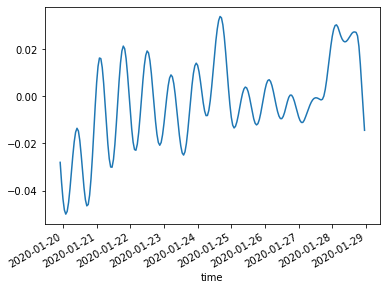

In [55]:
up.plot()

In [ ]:
c_min
c_max
c_clim
c_clim_std

In [ ]:
c_clim

In [ ]:
d700=slab_model.create_wacm_from_model(coas_model,1/4,1/4,'700_1800',lat_i=lat_i,lon_i=lon_i,times=times)

In [ ]:
d700.uw_wacm.plot()
d700.vw_wacm.plot()

In [18]:
c_clim,c_clim_std = m.getmld(lat_i,lon_i,month)

c_min = np.nanmax([0,c_clim-5*c_clim_std])
c_max = np.nanmin([2000,c_clim+5*c_clim_std])

#try:
up,vp,utid,vtid,param=d700.get_wacm_nio(t_out,fitting_method=fitting_method,
                                        has_tides=False,uv_noise=uv_noise,
                                        wind_noise=0,use_hourly_wind=use_hourly_wind,
                                        is_windstress=True,c_clim=c_clim,c_max=c_max,c_min=c_min)

14993.916666666666
15003.279675925925
-0.00027541764531685195
-0.0036862131596667146
[14993.91666667 14994.63689815 14995.35712963 14996.07736111
 14996.79759259 14997.51782407 14998.23805556 14998.95828704
 14999.67851852 15000.39875    15001.11898148 15001.83921296
 15002.55944444 15003.27967593]
2.531790430383844e-05
60.0
2e-06
14993.916666666666
15003.279675925925
-0.0002754325464780458
-0.0036862131596667146
[14993.91666667 14994.63689815 14995.35712963 14996.07736111
 14996.79759259 14997.51782407 14998.23805556 14998.95828704
 14999.67851852 15000.39875    15001.11898148 15001.83921296
 15002.55944444 15003.27967593]
2.531790430383844e-05
60.0
2e-06
14993.916666666666
15003.279675925925
-0.00027541764531685195
-0.0036862280608279084
[14993.91666667 14994.63689815 14995.35712963 14996.07736111
 14996.79759259 14997.51782407 14998.23805556 14998.95828704
 14999.67851852 15000.39875    15001.11898148 15001.83921296
 15002.55944444 15003.27967593]
2.531790430383844e-05
60.0
2e-06
14

In [16]:
t_out

DatetimeIndex(['2020-01-19 00:00:00', '2020-01-19 01:00:00',
               '2020-01-19 02:00:00', '2020-01-19 03:00:00',
               '2020-01-19 04:00:00', '2020-01-19 05:00:00',
               '2020-01-19 06:00:00', '2020-01-19 07:00:00',
               '2020-01-19 08:00:00', '2020-01-19 09:00:00',
               ...
               '2020-01-28 14:00:00', '2020-01-28 15:00:00',
               '2020-01-28 16:00:00', '2020-01-28 17:00:00',
               '2020-01-28 18:00:00', '2020-01-28 19:00:00',
               '2020-01-28 20:00:00', '2020-01-28 21:00:00',
               '2020-01-28 22:00:00', '2020-01-28 23:00:00'],
              dtype='datetime64[ns]', length=240, freq='H')

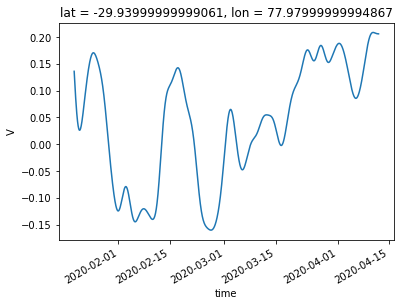

In [17]:
d700.v_truth_low.plot()

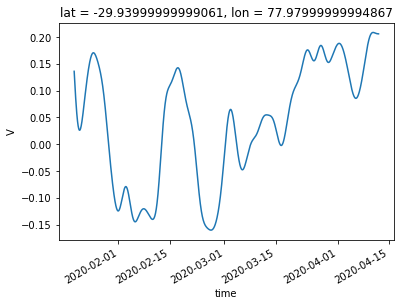

In [17]:
d700.v_truth_low.plot()

In [ ]:
T_tide = [1,2,3]

[0,0,0,0]*len(T_tide)

In [ ]:
time=d700.u_wacm_total.time.values
u,v,H,c=[],[],[],[]
print(time.size)
nn=10 #days

freq=1 #days
fig,ax=plt.subplots(figsize=(30,10))

for i in range(1):
    print(i)
    for j in pd.date_range(time[20],periods=4,freq='%iD'%freq):
        t00=j-np.timedelta64(int(nn/2*24)-i*12,'h') 
        t11=j+np.timedelta64(int(nn/2*24)+i*12,'h') 
        uwacm=d700.u_truth_total.sel(time=slice(t00,t11))
        t0=uwacm.time.values[0]
        t1=uwacm.time.values[-1]
        newt=pd.date_range(j-np.timedelta64(freq*12,'h'), periods=freq*24, freq='h')
        
        #t0=time[j];t1=time[j+nn]
        up,vp,param=d700.get_wacm_nio(t0,t1,has_tides=True,use_hourly_wind=False)
        up.plot(ax=ax)
        try:    
            upp=xr.concat([upp,up.interp(time=newt)],dim='time')
            vpp=xr.concat([vpp,vp.interp(time=newt)],dim='time')
            print(t0,t1,param['cost'],param['H'])
            del up,vp
        except:
            upp=up.interp(time=newt)
            vpp=vp.interp(time=newt)
            print(t0,t1,param['cost'],param['H'])
        

    u.append(upp)
    v.append(vpp)
    del upp,vpp
d700.u_truth_high_notide.sel(time=slice(u[0].time.values[0],u[-1].time.values[-1])).plot(color='k',lw=2)
d700.u_truth_high_notide_nio.sel(time=slice(u[0].time.values[0],u[-1].time.values[-1])).plot(color='gray',lw=2)

In [ ]:
fig,ax=plt.subplots(figsize=(30,10))
d700.u_truth_high_notide.sel(time=slice(u[0].time.values[0],u[-1].time.values[-1])).plot(color='k',lw=3)
#d700.u_truth_high_notide_nio.sel(time=slice(u[0].time.values[0],u[-1].time.values[-1])).plot(color='r',lw=1)
for uu in u:
    c=mysignal.filter_butter(uu.values,[0.96*f0,1.04*f0],2*np.pi/3600,'bandpass')
    uu.plot()
    u0=uu.copy()
    u0.data[:]=c[:]
    #u0.plot(color='g')


In [ ]:
#loop through every ten days


ttend=d700.u_wacm_total[-1].time.data

total_days=uobs.size//24

for t00 in d700.u_wacm_total[:4].time.values:
    u_wacm_nio=uobs*0
    v_wacm_nio=vobs*0
    H_wacm=uobs*0
    c_wacm=uobs*0
    #print(i,np.datetime64('now'))
    #for ii in range(i,8541-240,240)[:5]: 
    print(t00)
    print(pd.date_range(t00,'2008-05-28T21:20:00.000000000',freq='6D'))
    for it0 in np.range(0,total_days,6*24):
        t0=t00+np.timedelta64(it0,'h')
        t1=t0+np.timedelta64(it0+6*24,'h')
        t_out=u_wacm_nio.sel(time=slice(t0,t1)).data[:]
        up,vp,param=d700.get_wacm_nio(t0,t1,use_hourly_wind=True)
        u_wacm_nio.sel(time=slice(t0,t1)).data[:]=up.interp(time=t_out).data[:]
        v_wacm_nio.sel(time=slice(t0,t1)).data[:]=vp.interp(time=t_out).data[:]
        #H_wacm[ii:ii+240].data[:]=param['H']
        #c_wacm[ii:ii+240].data[:]=param['c']
    u.append(u_wacm_nio)
    v.append(v_wacm_nio)
    #H.append(H_wacm)
    #c.append(c_wacm)
    

In [ ]:
fig,ax=plt.subplots(3,1,figsize=(10,10))
d700.u_truth_high_notide_nio.sel(time=slice('2007-09-20 00:00:00',t1)).plot(ax=ax[0],color='k',lw=3)

for uu in u:
    uu.plot(ax=ax[0])


In [ ]:
uu=xr.DataArray(np.zeros((24,u[0].size)), dims=('case','time'),
                coords={'case':range(24),'time':u[0].time.values})
vv=xr.DataArray(np.zeros((24,u[0].size)), dims=('case','time'),
                coords={'case':range(24),'time':u[0].time.values})

for i in range(4):
    uu[i,:]=u[i].interp(time=u[0].time.values)
    vv[i,:]=v[i].interp(time=u[0].time.values)

fig,ax=plt.subplots(3,1,figsize=(10,10))

tt0,tt1='2007-06-20','2007-06-29'
for i in range(4):
    #uu[i,:].sel(time=slice(tt0,tt1)).plot(ax=ax[0],color='gray')
    u[i].sel(time=slice(tt0,tt1)).plot(ax=ax[0])
    d700.u_truth_high_notide_nio.sel(time=slice(tt0,tt1)).plot(ax=ax[0],color='gray',lw=3)
    
uu=d700.u_truth_high_notide_nio
vv=d700.v_truth_high_notide_nio


((uu**2+vv**2)**0.5).resample(time='1D').mean().plot(color='red',lw=1)

In [ ]:
((u_wacm_nio**2+v_wacm_nio**2)**0.5).resample(time='1D').mean().plot(label='wacm')
((d700.u_truth_high_notide_nio**2+d700.v_truth_high_notide_nio**2)**0.5).resample(time='1D').mean().plot(label='true')
plt.legend()